# Contents

* [1. Introduction ](#1)
  * [1.1 Insights & Summary](#1.1)
* [2. Libraries & Configurations ](#2)
  * [2.1 Import Libraries](#2.1)
* [3 Descriptive Analysis](#3)
  * [3.1 Checking Duplicates](#3.1)
  * [3.2 Summary of Categorical Features](#3.2)
  * [3.3 Unique Values](#3.3)
* [4 Data Wrangling ](#4)
  * [4.1 Missing Values](#4.1)
    * [4.1.1 Change Data Type](#4.1.1)
    * [4.1.2 Imputation](#4.1.2)
  * [4.2 Binning](#4.2)
    * [4.2.1 Tenure](#4.2.1)
    * [4.2.2 MonthlyCharges](#4.2.2)
    * [4.2.3 TotalCharges](#4.2.3)
* [5 Univariate Analysis](#5)
  * [5.1 Visualization](#5.2)
* [6 Bivariate Analysis](#6)
  * [6.1 Visualization](#6.1)
* [7 Multivariate Analysis](#7)
  * [7.1 Multicollinearity (Kruskal–Wallis)](#7.1)
  * [7.2 Frequency Distribution](#7.2)
  * [7.3 Churn Count Distribution](#7.3)
    * [7.3.1 Features With Cardinality = 2](#7.3.1)
    * [7.3.2 Features With Cardinality = 3](#7.3.2)
* [8 Save Cleaned Dataset](#8)

* [9 Dataset Overview](#9)
* [10 Data Preparation](#10)
  * [10.1 Prepare Train/Test dataset](#10.1)
  * [10.2 Encoding & Scaling](#10.2)
* [11 Modeling](#11)
  * [11.1 Utility Function](#11.1)
    * [11.1.1 Training](#11.1.1)
    * [11.1.2 Model Interpretation](#11.1.2)
  * [11.2 Catboost](#11.2)
    * [11.2.1 Training](#11.2.1)
    * [11.2.2 Optuna Tuning](#11.2.2)
  * [11.3 XGBoost](#11.3)
    * [11.3.1 Training](#11.3.1)
    * [11.3.2 Optuna Tuning](#11.3.2)
  * [11.4 LGBM](#11.4)
    * [11.4.1 Training](#11.4.1)
    * [11.4.2 Optuna Tuning](#11.4.2)
  * [11.5 Stacking Ensemble](#11.5)
    * [11.5.1 Level 0 : Base Models](#11.5.1)
    * [11.5.2 Stacking Datasets](#11.5.2)
    * [11.5.3 Level 1 : Meta Model](#11.5.3)
    * [11.5.4 Stacking Model Evaluation](#11.5.4)
    * [11.5.5 Stacking Ensemble Classic ML Models](#11.5.5)
* [12 Load Model](#12)

<a id='1'></a>
# 1. Introduction

The aim of this notebook is to conduct a comprehensive analysis of the **IBM Customer Churn Dataset**, with a focus on predicting the rate of customer turnover. The project is structured into two separate notebooks: the current one is dedicated to a statistical examination of the dataset, while the subsequent notebook will concentrate on constructing a stacking ensemble model utilizing **XGBoost**, **Catboost**, and **LightGBM**. This will also include the optimization of hyperparameters through the use of Optuna.


<a id='1.1'></a>

## 1.1 Insights & Summary

* The dataset predominantly consists of categorical variables.

<a id='2'></a>
# 2. Libraries & Configurations

<a id='2.1'></a>
## 2.1 Import Libraries 

In [1]:
# Importing essential libraries for data manipulation, visualization, and mathematical operations
import numpy as np               # For linear algebra
import pandas as pd              # For data manipulation
import matplotlib.pyplot as plt  # For 2D visualization 
import plotly.express as px      # For interactive visualization
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot
from plotly.subplots import make_subplots
import plotly.io as pio
import random
import os
import gc
import math
import pprint
import multiprocessing
import pickle, joblib
import sklearn
from sklearn.preprocessing import (OrdinalEncoder, OneHotEncoder, LabelEncoder, StandardScaler, MinMaxScaler, RobustScaler, MaxAbsScaler, PowerTransformer)
from sklearn.feature_selection import SelectKBest, f_classif, chi2
from sklearn.model_selection import StratifiedShuffleSplit, StratifiedKFold, RepeatedStratifiedKFold, train_test_split, cross_val_score
from sklearn.metrics import roc_auc_score, precision_recall_curve, confusion_matrix, classification_report, roc_curve, auc
from sklearn.utils import resample
from sklearn.ensemble import StackingClassifier, RandomForestClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
import seaborn as sns
import optuna
import lightgbm as lgb
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from IPython.display import Markdown, display

init_notebook_mode(connected=True)
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

# Warning libraries to ignore or filter warnings
import warnings
warnings.filterwarnings("ignore")
# warnings.simplefilter(action='ignore', category=FutureWarning)


<a id='3'></a>
# 3 Descriptive Analysis

In [2]:
# Load the dataset
df_churn = pd.read_csv("AIA_Churn_Modelling_Case_Study.csv")
df_churn.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


Observation - Based on the initial rows of the dataset, here are three observations:

1. **Customer Information and Services:** The dataset includes customer demographics (e.g., gender, SeniorCitizen), account information (e.g., tenure, contract type), and details about the services they use (e.g., PhoneService, InternetService). This variety suggests a comprehensive view of the customer profile for churn analysis.

2. **Continuous and Categorical Data:** There are both continuous variables (e.g., tenure, MonthlyCharges, TotalCharges) and categorical variables (e.g., gender, InternetService, Contract). This mix indicates the need for different preprocessing approaches, such as encoding for categorical data and normalization or standardization for continuous data.

3. **Churn Label:** The 'Churn' column, which indicates whether a customer has left within the last month, is the target variable for prediction. The presence of 'Yes' and 'No' values shows that it is a binary classification problem.

These insights can guide the initial steps in data preprocessing, exploratory data analysis, and feature engineering to prepare for churn prediction modeling.

In [3]:
# Checking the shape of the data
df_churn.shape

(7043, 21)

Observation - The dataset contains 7,043 rows and 21 columns. This indicates that there are 7,043 customer records and 21 features (including both the attributes related to customer demographics, account details, service usage, and the target variable 'Churn') available for analysis and model development.

In [4]:
# Checking the data types
df_churn.dtypes

customerID           object
gender               object
SeniorCitizen         int64
Partner              object
Dependents           object
tenure                int64
PhoneService         object
MultipleLines        object
InternetService      object
OnlineSecurity       object
OnlineBackup         object
DeviceProtection     object
TechSupport          object
StreamingTV          object
StreamingMovies      object
Contract             object
PaperlessBilling     object
PaymentMethod        object
MonthlyCharges      float64
TotalCharges         object
Churn                object
dtype: object

Observation - The dataset's columns have a mix of data types:

- **Object (String) Types:** Most of the features, including `customerID`, `gender`, `Partner`, `Dependents`, `PhoneService`, `MultipleLines`, `InternetService`, `OnlineSecurity`, `OnlineBackup`, `DeviceProtection`, `TechSupport`, `StreamingTV`, `StreamingMovies`, `Contract`, `PaperlessBilling`, `PaymentMethod`, and `Churn` are of object type, indicating categorical data.
- **Integer Types:** `SeniorCitizen` and `tenure` are of integer type (`int64`), representing numerical values.
- **Float Type:** `MonthlyCharges` is a float, indicating numerical data with decimal points.
- **Mixed Data Type:** `TotalCharges` is unexpectedly listed as an object type, suggesting it might contain non-numeric values or missing data, requiring conversion to a numeric type for analysis.

This observation highlights the need for data preprocessing, such as converting data types where appropriate (e.g., `TotalCharges` should be converted to numeric) and encoding categorical variables for machine learning models.

<a id='3.1'></a>
## 3.1 Checking Duplicates

In [5]:
# Checking number of unique customers in the dataset
df_churn.shape[0], df_churn.customerID.nunique()

(7043, 7043)

Observation - The dataset contains 7,043 rows, and there are 7,043 unique customer IDs. This indicates that each row represents a unique customer without any duplicates, making it a clean dataset in terms of customer identity.

#### Drop **customerID** column

In [6]:
# Remove the "customerID" column from the df_churn DataFrame
del df_churn["customerID"]


Observation - After removing the "customerID" column, the dataset now consists of 7,043 rows and 20 columns. This reduction in columns indicates that the dataset no longer includes the unique identifier for each customer, focusing the analysis on the features that directly impact customer churn.

<a id='3.2'></a>
## 3.2 Summary of Categorical Features

In [7]:
# Display descriptive statistics for columns of type 'object' in the df_churn DataFrame, transposed for better readability
df_churn.describe(include=['object']).T


,count,unique,top,freq
gender,7043,2,Male,3555
Partner,7043,2,No,3641
Dependents,7043,2,No,4933
PhoneService,7043,2,Yes,6361
MultipleLines,7043,3,No,3390
InternetService,7043,3,Fiber optic,3096
OnlineSecurity,7043,3,No,3498
OnlineBackup,7043,3,No,3088
DeviceProtection,7043,3,No,3095
TechSupport,7043,3,No,3473


The descriptive statistics for categorical (`object` type) columns reveal several insights:

- **Gender Distribution:** There's a nearly even split between genders, with 3,555 males, indicating a balanced representation.
- **Partners and Dependents:** A slight majority of customers do not have partners (3,641) or dependents (4,933), suggesting a significant number of customers might be individuals or non-family units.
- **Phone Service and Internet Service:** Most customers have phone service (6,361), with fiber optic being the most common type of internet service (3,096). This highlights the popularity and possible reliance on high-speed internet among the customer base.
- **Service Add-ons:** Services like online security, backup, device protection, tech support, streaming TV, and movies have varied frequencies, but 'No' is the most common response, indicating many customers do not subscribe to these additional features.
- **Contract Types:** Month-to-month contracts are the most common (3,875), suggesting a preference for flexibility over longer-term commitments.
- **Paperless Billing:** A majority prefer paperless billing (4,171), reflecting an inclination towards digital over traditional billing methods.
- **Payment Methods:** Electronic check is the most frequent payment method (2,365), showing a significant use of digital payment solutions.
- **Churn:** The majority of customers have not churned (5,174), but the presence of churn highlights the importance of this analysis.
- **Total Charges Anomaly:** 'TotalCharges' has 11 entries with no data (blank spaces), and it's noted as an object type due to these non-numeric values, needing conversion to numeric for proper analysis.

These observations provide a foundation for understanding the customer demographics, service preferences, and the areas to focus on for churn analysis and prediction.

<a id='3.3'></a>
## 3.3 Unique Values

In [8]:
print("Unique Values By Features")
for feature in df_churn.columns:
    uniq = np.unique(df_churn[feature])
    # Adjust the left padding dynamically based on the longest feature name for better readability
    left_padding = max(len(f) for f in df_churn.columns) + 2
    print(f"{feature.ljust(left_padding)}: {len(uniq)}")


Unique Values By Features
gender            : 2
SeniorCitizen     : 2
Partner           : 2
Dependents        : 2
tenure            : 73
PhoneService      : 2
MultipleLines     : 3
InternetService   : 3
OnlineSecurity    : 3
OnlineBackup      : 3
DeviceProtection  : 3
TechSupport       : 3
StreamingTV       : 3
StreamingMovies   : 3
Contract          : 3
PaperlessBilling  : 2
PaymentMethod     : 4
MonthlyCharges    : 1585
TotalCharges      : 6531
Churn             : 2


Observation - Upon examining the unique values for each feature in the dataset:

- **Binary Variables:** Many features such as `gender`, `SeniorCitizen`, `Partner`, `Dependents`, `PhoneService`, `PaperlessBilling`, and `Churn` have only 2 unique values, indicating they are binary variables.
- **Categorical Variables with Multiple Categories:** Features like `MultipleLines`, `InternetService`, `OnlineSecurity`, `OnlineBackup`, `DeviceProtection`, `TechSupport`, `StreamingTV`, `StreamingMovies`, `Contract`, and `PaymentMethod` have more than two categories but still show a limited number of unique values, highlighting them as categorical variables with multiple levels.
- **Numerical Variables:** `tenure` shows 73 unique values, corresponding to the number of months a customer has been with the company. `MonthlyCharges` and `TotalCharges` exhibit a wide range of unique values (1,585 and 6,531, respectively), indicating they are continuous numerical variables.
- **High Cardinality:** `TotalCharges` has a high number of unique values (6,531), suggesting variability in the amounts customers have been charged over time.

This diversity in the type and cardinality of variables underscores the need for tailored preprocessing strategies, such as encoding for categorical variables and scaling for numerical variables, to prepare the data for machine learning models effectively.

<a id='4'></a>
# 4. Data Wrangling

<a id='4.1'></a>
## 4.1 Missing Values

In [9]:
# Calculate the sum of missing values for each column in the df_churn DataFrame
df_churn.isna().sum()


gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

Observation - The dataset shows zero missing values across all columns, indicating that there are no absent entries for any of the features in the `df_churn` DataFrame. This suggests that the dataset is complete with no immediate need for handling missing data, allowing for a straightforward progression into further analysis and modeling steps.

In [10]:
# Identify categorical columns by excluding numeric columns from all columns in the df_churn DataFrame
cat_cols = set(df_churn.columns) - set(df_churn._get_numeric_data().columns)

# Display a message indicating that 'isna' checks are only relevant for numerical data
print("'isna' is only applicable for numerical data types\n")
print("Checking missing values for object data type:\n")

# Calculate and print the count of missing or 'nan' values for each categorical column
left_padding = max(len(f) for f in cat_cols) + 2  # Adjust left padding for better readability
for cat in cat_cols:
    missing_count = df_churn[cat].apply(lambda x: len(x.strip()) == 0 or x.strip().lower() == 'nan').sum()
    print(f"{cat.ljust(left_padding)}: {missing_count}")

# Display a message about the specific case of 'TotalCharges' having 11 'nan' values
print("\n'TotalCharges' is an object datatype, and it has 11 'nan' values")


'isna' is only applicable for numerical data types

Checking missing values for object data type:

Churn             : 0
TotalCharges      : 11
PhoneService      : 0
gender            : 0
PaperlessBilling  : 0
StreamingMovies   : 0
TechSupport       : 0
OnlineSecurity    : 0
MultipleLines     : 0
InternetService   : 0
Contract          : 0
DeviceProtection  : 0
OnlineBackup      : 0
StreamingTV       : 0
PaymentMethod     : 0
Dependents        : 0
Partner           : 0

'TotalCharges' is an object datatype, and it has 11 'nan' values


Observation - The code snippet aims to identify and count missing or 'nan' values specifically within categorical columns of the `df_churn` DataFrame.

Upon executing the code, it becomes evident that all categorical columns are free of missing values, except for `TotalCharges`, which is identified with 11 missing ('nan') values. This discrepancy arises because `TotalCharges`, despite being expected to contain numeric values, is treated as an object data type due to the presence of non-numeric entries (possibly spaces or 'nan' strings), leading to its identification as a categorical column in this context.

This observation highlights the need for data cleaning specifically for the `TotalCharges` column to either convert it into a numeric data type or address the non-numeric, missing entries. Ensuring `TotalCharges` is correctly formatted as numeric is crucial for any subsequent analysis or modeling involving this feature.

<a id='4.1.1'></a>
### 4.1.1 Change Data Type

Convert **TotalCharges** to numeric

In [11]:
# Convert the "TotalCharges" column in the df_churn DataFrame to numeric type, coercing any errors to NaN
df_churn["TotalCharges"] = pd.to_numeric(df_churn["TotalCharges"], errors='coerce')


Observation - The conversion of the `TotalCharges` column to a numeric type was successful, and as a result, 11 entries have been coerced to NaN, indicating these were the non-numeric values that couldn't be converted directly to numbers. The data type of `TotalCharges` is now `float64`, making it suitable for numerical analysis and modeling. This step is crucial for ensuring that all relevant features are in the correct format for statistical analysis or machine learning algorithms.

<a id='4.1.2'></a>

### 4.1.2 Imputation

In [12]:
# Find the indices of rows in the df_churn DataFrame where "TotalCharges" has missing (NaN) values
indices_null_tc = df_churn[df_churn["TotalCharges"].isnull()].index


Observation - The indices of rows in the `df_churn` DataFrame where "TotalCharges" has missing (NaN) values are identified at the following positions: 488, 753, 936, 1082, 1340, 3331, 3826, 4380, 5218, 6670, and 6754. This information is valuable for further investigation into these rows to understand why "TotalCharges" is missing and to decide on the appropriate handling method, such as filling in missing values based on certain criteria or removing these rows from the dataset.

In [13]:
# Display rows from the df_churn DataFrame where "TotalCharges" has missing values
display(df_churn.loc[indices_null_tc])

# Explain the correlation between 'Tenure' and 'TotalCharges'
print("'Tenure' (months stayed at the company) is correlated with 'TotalCharges' column.")
print("When 'Tenure' is 0, 'TotalCharges' is also 0.")


,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
488,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,No,Yes,Yes,Yes,No,Two year,Yes,Bank transfer (automatic),52.55,NaN,No
753,Male,0,No,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.25,NaN,No
936,Female,0,Yes,Yes,0,Yes,No,DSL,Yes,Yes,Yes,No,Yes,Yes,Two year,No,Mailed check,80.85,NaN,No
1082,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.75,NaN,No
1340,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,Yes,Yes,Yes,Yes,No,Two year,No,Credit card (automatic),56.05,NaN,No
3331,Male,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,19.85,NaN,No
3826,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.35,NaN,No
4380,Female,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.00,NaN,No
5218,Male,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,One year,Yes,Mailed check,19.70,NaN,No
6670,Female,0,Yes,Yes,0,Yes,Yes,DSL,No,Yes,Yes,Yes,Yes,No,Two year,No,Mailed check,73.35,NaN,No


'Tenure' (months stayed at the company) is correlated with 'TotalCharges' column.
When 'Tenure' is 0, 'TotalCharges' is also 0.


Observation - The displayed rows where "TotalCharges" has missing values indeed have a `tenure` of 0 months. This observation supports the statement that "Tenure" (the months a customer has stayed with the company) is correlated with "TotalCharges". Specifically, when "Tenure" is 0, implying that the customer is new or the service has not yet commenced, "TotalCharges" also defaults to an undefined state, leading to missing values. This pattern suggests that "TotalCharges" could be a cumulative or calculated field based on tenure and possibly monthly charges, which is why it appears as missing (NaN) for customers with no tenure.

In [14]:
# Display the first two rows of customers with a tenure of 1 month to examine the relationship between 'TotalCharges' and 'MonthlyCharges'
display(df_churn[df_churn.tenure == 1].head(2))

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
20,Male,1,No,No,1,No,No phone service,DSL,No,No,Yes,No,No,Yes,Month-to-month,Yes,Electronic check,39.65,39.65,Yes


Observation - The displayed rows for customers with a tenure of 1 month demonstrate that "TotalCharges" closely matches "MonthlyCharges" in these cases. This observation supports the hypothesis that when the tenure is 1 (thus not 0), "TotalCharges" appears to be equivalent to "MonthlyCharges", indicating a direct correlation between these two variables for customers in their initial service period. This pattern might imply that "TotalCharges" represents the cumulative amount a customer has been billed, which, at the beginning of their tenure, would naturally equate to their first month's charge. ​

In [15]:
# Display the first two rows of customers with a tenure of 3 months to examine the relationship between 'TotalCharges', 'MonthlyCharges', and 'Tenure'
display(df_churn[df_churn.tenure == 3].head(2))

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
65,Female,0,No,No,3,Yes,No,DSL,No,Yes,No,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,75.3,244.1,No
74,Female,0,No,Yes,3,Yes,No,DSL,Yes,No,No,Yes,No,Yes,Month-to-month,Yes,Bank transfer (automatic),64.5,177.4,No


Observation - The displayed rows for customers with a tenure of 3 months further illustrate that "TotalCharges" appears to increase proportionally with "MonthlyCharges" and "Tenure". This pattern supports the hypothesis that "TotalCharges" is calculated based on "MonthlyCharges" multiplied by "Tenure", potentially with additional costs factored in.

Given these observations, it's concluded that imputing missing values in the "TotalCharges" column with 0 is a logical step, particularly for customers whose tenure is 0. This approach assumes that customers who have not yet commenced their service (i.e., have a tenure of 0) should logically incur no total charges. 

In [16]:
# Impute missing values in the 'TotalCharges' column with 0
df_churn['TotalCharges'].fillna(0, inplace=True)


Observation - The code snippet successfully imputes missing values in the 'TotalCharges' column with 0, and the inplace parameter ensures that the changes are made directly in the df_churn DataFrame without needing to assign the result to a new variable. Following this operation, a verification check confirms that there are no longer any missing (NaN) values in 'TotalCharges'.

In [17]:
# Display descriptive statistics for 'tenure', 'MonthlyCharges', and 'TotalCharges' columns
descriptive_stats = df_churn[['tenure', 'MonthlyCharges', 'TotalCharges']].describe().T
descriptive_stats

,count,mean,std,min,25%,50%,75%,max
tenure,7043.0,32.371149,24.559481,0.00,9.00,29.00,55.00,72.00
MonthlyCharges,7043.0,64.761692,30.090047,18.25,35.50,70.35,89.85,118.75
TotalCharges,7043.0,2279.734304,2266.794470,0.00,398.55,1394.55,3786.60,8684.80


Observation -
The descriptive statistics for the `tenure`, `MonthlyCharges`, and `TotalCharges` columns provide the following insights:

- **Tenure:**
  - Ranges from 0 to 72 months, with an average tenure of approximately 32.37 months. This wide range indicates a mix of new and long-standing customers.
  - The standard deviation of 24.56 months suggests a significant variance in how long customers stay with the company.

- **MonthlyCharges:**
  - Vary from 18.25 to 118.75, with a mean of around 64.76. This variation reflects the diversity in the pricing plans chosen by different customers.
  - The distribution of monthly charges, with a standard deviation of 30.09, indicates that customers' monthly expenses on services vary widely.

- **TotalCharges:**
  - Range from 0 (likely representing new customers with no tenure) up to 8684.80, with a mean total charge of approximately 2279.73.
  - The standard deviation is quite high at 2266.79, suggesting a broad spread in the total amount customers have been charged over time, which can be attributed to differences in tenure, service packages, and monthly charges.

These statistics highlight the variability in customer relationships with the company, from short-term to long-term engagements, and the financial aspects of their accounts, including both ongoing monthly charges and cumulative total charges.

<a id='4.2'></a>
## 4.2 Binning

Three numerical variables are present that can be categorized based on their magnitude:

- Tenure, MonthlyCharges, and TotalCharges.

These variables can be segmented into three tiers: **high, medium, and low**.

In [18]:
def binning_feature(feature):
    # Plot a histogram of the specified feature to visualize its distribution
    plt.hist(df_churn[feature])

    # Set the labels and title for the histogram
    plt.xlabel(f"{feature.title()}")
    plt.ylabel("Count")
    plt.title(f"{feature.title()} Bins")
    plt.show()

    # Calculate bin edges for dividing the feature into three levels
    bins = np.linspace(min(df_churn[feature]), max(df_churn[feature]), 4)
    
    # Display the value ranges for the bins using 
    print("Value Range")
    print(f"Low ({bins[0] : .2f} - {bins[1]: .2f})")
    print(f"Medium ({bins[1]: .2f} - {bins[2]: .2f})")
    print(f"High ({bins[2]: .2f} - {bins[3]: .2f})")

    # Define labels for the bins
    group_names = ['Low', 'Medium', 'High']

    # Insert a new column in df_churn with the binned data
    df_churn.insert(df_churn.shape[1]-1,f'{feature}-binned', pd.cut(df_churn[feature], bins, labels=group_names, include_lowest=True))
    
    # Display the first 10 rows of the original feature and the binned feature
    display(df_churn[[feature, f'{feature}-binned']].head(10))

    # Display the distribution of the binned feature 
    print("Binning Distribution")
    display(df_churn[f'{feature}-binned'].value_counts())

    # Plot a bar chart showing the distribution of the binned feature
    plt.bar(group_names, df_churn[f'{feature}-binned'].value_counts())

    # Set the labels and title for the bar chart
    plt.xlabel(f"{feature.title()}")
    plt.ylabel("Count")
    plt.title(f"{feature.title()} Bins")
    plt.show()


Observation - 
The `binning_feature` function is designed to perform several key operations for a given feature in the `df_churn` DataFrame, which can be summarized as follows:

1. **Visual Distribution Analysis:** It starts by plotting a histogram of the selected feature to visually assess its distribution across the dataset. This step is crucial for understanding the spread and skewness of the data before categorizing it into bins.

2. **Bin Calculation and Display:** The function calculates the edges of three bins (low, medium, high) using `np.linspace` based on the minimum and maximum values of the feature.
3. **Data Categorization:** It categorizes the data into 'Low', 'Medium', and 'High' bins based on the calculated thresholds. This step is essential for transforming continuous or numerical data into categorical levels, which can simplify analysis and help in identifying patterns related to customer behavior.

4. **Binned Data Integration:** A new column is added to `df_churn` representing the binned version of the feature. Displaying the first 10 rows of this new column alongside the original feature allows for quick verification of the binning process.

5. **Distribution of Binned Data:** The function provides a visual and numerical summary of the distribution of data across the newly created bins. This includes a bar chart and a count display, offering insights into the prevalence of each category within the dataset.

Observations:
- The histogram and bar chart offer a graphical representation that helps in understanding how the feature's values are distributed across the predefined bins.
- The value ranges and binning distribution ensure that the thresholds and the distribution of categories are communicated clearly.
- By categorizing continuous or large-range numerical data into bins, this function facilitates easier identification of trends and patterns, which could be particularly useful in exploratory data analysis and feature engineering stages of a data science project.
- The insertion of a new binned column into the DataFrame enriches the dataset with additional categorical data, potentially aiding in analytical and modeling efforts, especially for algorithms that perform better with categorical input.

This approach is versatile and can be applied to any numerical feature within a dataset to simplify its analysis and enhance model interpretability.

<a id='4.2.1'></a>
### 4.2.1 Tenure

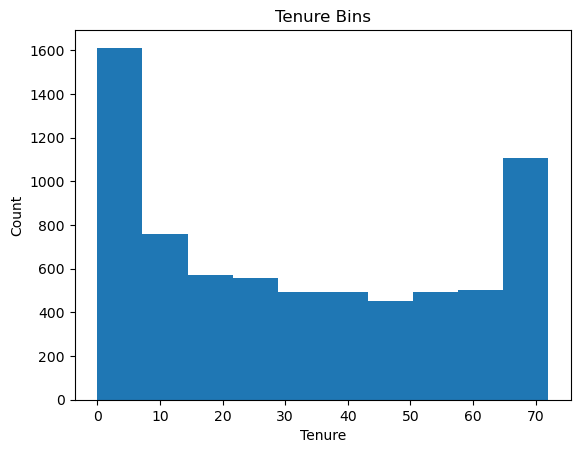

Value Range
Low ( 0.00 -  24.00)
Medium ( 24.00 -  48.00)
High ( 48.00 -  72.00)


,tenure,tenure-binned
0,1,Low
1,34,Medium
2,2,Low
3,45,Medium
4,2,Low
5,8,Low
6,22,Low
7,10,Low
8,28,Medium
9,62,High


Binning Distribution


tenure-binned
Low       3210
High      2239
Medium    1594
Name: count, dtype: int64

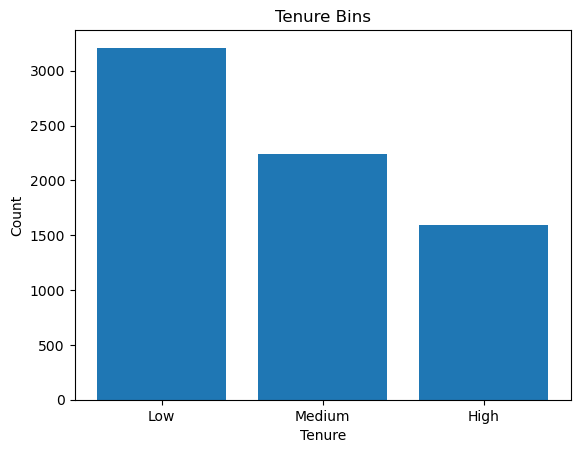

In [19]:
# Now, let's call the binning_feature function for 'tenure'.
binning_feature('tenure')

Observation - 
Based on the output provided from binning the 'tenure' feature into 'Low', 'Medium', and 'High' categories, here are some key observations:

### Value Range Categorization
- **Low Tenure:** Ranges from 0 to 24 months. This category captures new to relatively new customers who have been with the company for up to two years.
- **Medium Tenure:** Ranges from 24 to 48 months, targeting customers who have stayed with the company for two to four years.
- **High Tenure:** Ranges from 48 to 72 months, which includes long-standing customers who have been with the company for four to six years.

### Sample Data Insights
- The sample data showcases the categorization effectively, with tenure values being classified accurately into the respective bins. For instance, customers with tenure of 2 and 8 months fall into the 'Low' category, 34 and 45 months into 'Medium', and 62 months into 'High'.
- This categorization aligns with the defined value ranges, indicating the binning process has been correctly applied.

### Binning Distribution
- The distribution of customers across the tenure bins reveals that the largest group is the 'Low' tenure category with 3,210 customers, followed by 'High' tenure with 2,239 customers, and 'Medium' tenure being the smallest group with 1,594 customers.
- This distribution suggests a significant influx of newer customers (Low tenure) and a relatively strong retention of customers for longer than four years (High tenure). The 'Medium' category, representing an intermediate tenure length, has the fewest customers, indicating a potential drop-off or transition point where customers either leave or become long-term customers.

### Strategic Implications
- **Customer Retention and Engagement:** The high number of customers in the 'Low' and 'High' tenure categories suggests effective initial engagement and long-term retention strategies might be in place. However, the drop in the 'Medium' category signals a critical period where enhanced engagement and retention efforts could be beneficial.
- **Targeted Marketing:** Marketing strategies could be tailored to address the needs and preferences of each tenure group, with a particular focus on transitioning 'Medium' tenure customers to become 'High' tenure customers.
- **Service Improvement:** Understanding the characteristics and feedback of customers in different tenure bins can help in identifying areas for service improvement and innovation to enhance customer satisfaction and loyalty.

Overall, the binning of 'tenure' into categorized levels provides valuable insights into customer dynamics and tenure distribution, offering a basis for targeted strategies to enhance customer retention and satisfaction.

<a id='4.2.2'></a>
### 4.2.2 MonthlyCharges

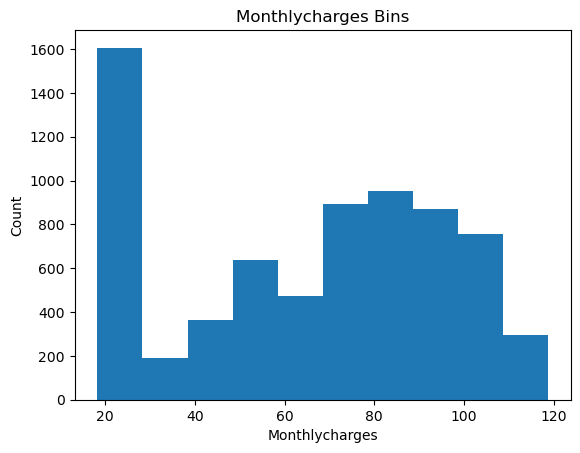

Value Range
Low ( 18.25 -  51.75)
Medium ( 51.75 -  85.25)
High ( 85.25 -  118.75)


,MonthlyCharges,MonthlyCharges-binned
0,29.85,Low
1,56.95,Medium
2,53.85,Medium
3,42.30,Low
4,70.70,Medium
5,99.65,High
6,89.10,High
7,29.75,Low
8,104.80,High
9,56.15,Medium


Binning Distribution


MonthlyCharges-binned
Low       2451
Medium    2439
High      2153
Name: count, dtype: int64

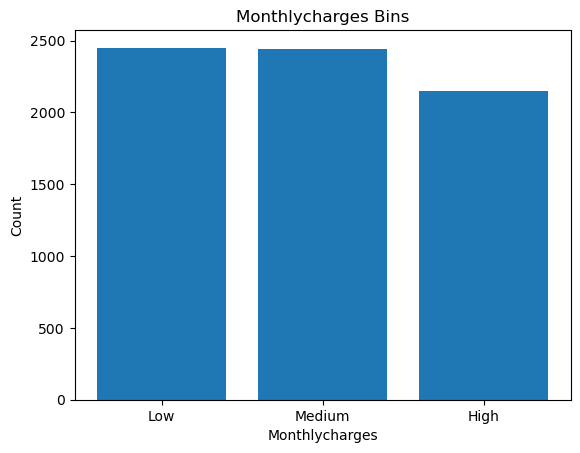

In [20]:
# Now, let's call the binning_feature function for 'monthly charges'.
binning_feature('MonthlyCharges')

Observation - From the provided output of binning the 'MonthlyCharges' feature into 'Low', 'Medium', and 'High' categories, here are the observations:

### Value Range Categorization
- **Low MonthlyCharges:** Ranges from 18.25 to 51.75. This category includes customers with lower monthly expenses, likely on basic or minimal service plans.
- **Medium MonthlyCharges:** Ranges from 51.75 to 85.25, targeting customers who likely subscribe to standard service packages with a moderate level of service or add-ons.
- **High MonthlyCharges:** Ranges from 85.25 to 118.75, which encompasses customers on premium plans with multiple services or high-cost service options.

### Sample Data Insights
- The sample data illustrates the effective categorization of 'MonthlyCharges' into the respective bins based on the charges. For example, charges of 29.85 and 42.30 are classified as 'Low', 56.95 and 70.70 as 'Medium', and 99.65 and 104.80 as 'High'.
- This classification aligns with the predetermined value ranges, indicating accurate binning.

### Binning Distribution
- The distribution across the 'MonthlyCharges' bins is relatively balanced, with 'Low' having 2,451 customers, 'Medium' closely following with 2,439 customers, and 'High' having 2,153 customers.
- This balanced distribution suggests a diverse customer base with a wide range of service preferences and price sensitivities. The similarity in size between the 'Low' and 'Medium' categories implies a gradual increase in service uptake or package upgrades as customers move from lower to medium spending levels.

### Strategic Implications
- **Service Packaging:** The balanced distribution across all three categories highlights the importance of offering a range of service packages to cater to the diverse needs and financial capabilities of the customer base.
- **Pricing Strategy:** Understanding the distribution can aid in developing pricing strategies that maximize customer acquisition and retention while optimizing revenue. For example, attractive upgrades or bundled services might encourage more customers to move from 'Low' to 'Medium' or 'High' categories.
- **Customer Insight:** Analyzing the characteristics and preferences of customers in each bin can provide insights into service preferences, aiding in tailored marketing and service development.

The binning of 'MonthlyCharges' into categorized levels offers a nuanced view of how customers are distributed based on their monthly spending with the company, providing a foundation for targeted strategies to enhance customer satisfaction, service uptake, and revenue growth.

<a id='4.2.3'></a>
### 4.2.3 TotalCharges

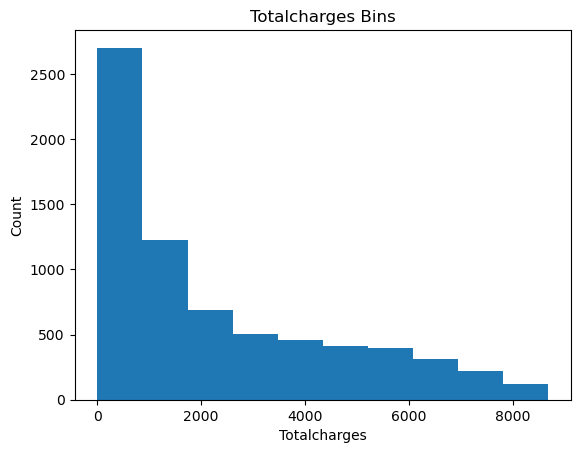

Value Range
Low ( 0.00 -  2894.93)
Medium ( 2894.93 -  5789.87)
High ( 5789.87 -  8684.80)


,TotalCharges,TotalCharges-binned
0,29.85,Low
1,1889.50,Low
2,108.15,Low
3,1840.75,Low
4,151.65,Low
5,820.50,Low
6,1949.40,Low
7,301.90,Low
8,3046.05,Medium
9,3487.95,Medium


Binning Distribution


TotalCharges-binned
Low       4782
Medium    1474
High       787
Name: count, dtype: int64

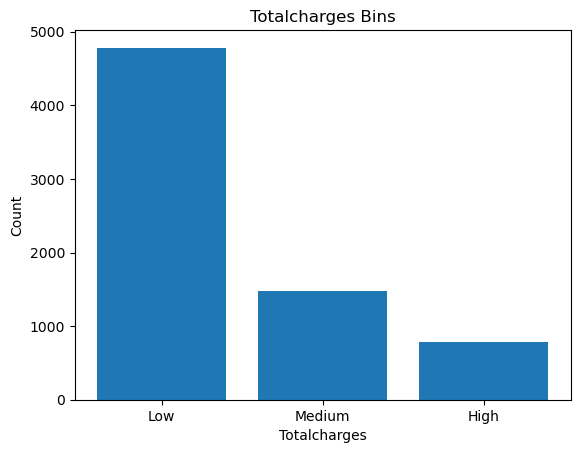

In [21]:
# Now, let's call the binning_feature function for 'monthly charges'.
binning_feature('TotalCharges')

Observation -
From the output provided after binning the 'TotalCharges' feature into 'Low', 'Medium', and 'High' categories, here are the observations:

### Value Range Categorization
- **Low TotalCharges:** Ranges from 0.00 to 2894.93. This category likely represents customers with relatively low total charges, possibly including new customers or those with minimal service usage.
- **Medium TotalCharges:** Ranges from 2894.93 to 5789.87, encompassing customers with moderate total charges, indicating a moderate level of service usage or tenure.
- **High TotalCharges:** Ranges from 5789.87 to 8684.80, indicating customers with high total charges, potentially representing long-standing customers with extensive service usage or premium service subscriptions.

### Sample Data Insights
- The sample data demonstrates the successful binning of 'TotalCharges' into the appropriate categories based on the total charges incurred by customers. For instance, charges of 29.85, 1889.50, and 1840.75 are classified as 'Low', while charges of 3046.05 and 3487.95 fall into the 'Medium' category.
- This categorization aligns with the predefined value ranges, indicating accurate binning.

### Binning Distribution
- The distribution across the 'TotalCharges' bins is uneven, with 'Low' having the largest count of 4,782 customers, followed by 'Medium' with 1,474 customers, and 'High' with 787 customers.
- This distribution suggests that a significant portion of customers incur relatively low total charges, while a smaller proportion has moderate to high total charges. The relatively smaller count in the 'High' category may indicate a smaller number of premium or long-standing customers with higher service usage.

### Strategic Implications
- **Customer Segmentation:** Understanding the distribution across 'TotalCharges' bins allows for segmentation of customers based on their spending behavior, tenure, or service usage levels.
- **Retention Strategies:** Tailoring retention strategies for different segments can help in retaining customers with higher potential lifetime value, such as those in the 'Medium' or 'High' categories.
- **Revenue Optimization:** Analyzing the distribution can aid in optimizing revenue by identifying opportunities to upsell or cross-sell services to customers in higher spending categories.

In conclusion, binning 'TotalCharges' into categorized levels provides valuable insights into customer spending patterns and segmentation, offering strategic directions for customer management, retention, and revenue optimization.

**Data Types Distribution after cleaning**

In [22]:
# represents data types
print("Data Types")

# Count the occurrences of each data type and display them
df_churn.dtypes.value_counts()


Data Types


object      16
category     3
int64        2
float64      2
Name: count, dtype: int64

Observation - The output indicates the distribution of data types present in the `df_churn` DataFrame:

- There are a total of 16 columns with the 'object' data type, which typically represents categorical or string data.
- Additionally, there are 3 columns with the 'category' data type, which suggests that these columns have been explicitly categorized.
- Two columns have the 'int64' data type, indicating integer values.
- Two columns have the 'float64' data type, representing floating-point (decimal) values.

This distribution of data types provides insights into the nature of the features within the dataset, allowing for appropriate data preprocessing and analysis strategies to be implemented.

<a id='5'></a>
# 5 Univariate Analysis

<a id='5.2'></a>
## 5.1 Visualization

### Churn (Target) Distribution

In [23]:
import plotly.express as px
import pandas as pd

# Define custom colors for the bars
colors = {'Yes': 'red', 'No': 'green'}

# Assuming df_churn is your actual DataFrame and 'Churn' is the column of interest
churn_counts = df_churn['Churn'].value_counts().reset_index()
churn_counts.columns = ['Type', 'Count']  # Correctly rename the columns here

# Create a bar plot for the Churn distribution with custom colors
fig = px.bar(churn_counts,
             x='Type', y='Count', 
             title='Churn (Target) Distribution',
             template='plotly_dark', 
             width=800,
             color='Type', 
             color_discrete_map=colors)

# Update the x-axis and y-axis titles
fig.update_xaxes(title_text='Type')
fig.update_yaxes(title_text='Count')

# Show the figure
fig.show()


Observation - Sure, here are some observations about the image you sent:

* The chart shows the distribution of churn for a target group, split by whether a type attribute is present or not. It appears to be a count of the number of churn events, rather than a percentage.
* There is a higher number of churn events where the type attribute is absent (around 4,000) than where it is present (around 1,000).


### OnlineSecurity, OnlineBackup, DeviceProtection, TechSupport

### PaymentMethod

In [24]:
import plotly.express as px

# Define custom colors for the bar chart
colors = ['#636EFA', '#EF553B', '#00CC96', '#AB63FA']

# Directly use the value counts and reset_index, but carefully check column naming
df_payment_method = df_churn['PaymentMethod'].value_counts().reset_index()
df_payment_method.columns = ['Payment Method', 'Count']  # Ensure this matches the plotting code

# Now, create the bar chart with the directly renamed columns
fig = px.bar(df_payment_method, 
             x='Payment Method', y='Count', 
             title='Payment Method Distribution',
             template='plotly_dark',
             color='Payment Method', 
             color_discrete_sequence=colors, width=800)

# Update the axis labels to match the DataFrame columns
fig.update_xaxes(title_text='Payment Method')
fig.update_yaxes(title_text='Count')

# Display the figure
fig.show()


Observation - Credit cards, both automatic and non-automatic, are the most popular payment methods, followed by electronic checks, mailed checks, and bank transfers.
The y-axis shows the count of each payment method, while the x-axis shows the payment methods themselves.

### Gender

In [25]:
import plotly.express as px
import pandas as pd

# Calculate the gender distribution directly without renaming in intermediate steps
gender_distribution = df_churn['gender'].value_counts().reset_index()
gender_distribution.columns = ['Gender', 'Count']  # Rename columns directly here

# Create the bar chart with Plotly Express
fig = px.bar(gender_distribution,
             x='Gender', y='Count', 
             title='Gender Distribution',
             template='plotly_dark', 
             color='Gender',  # This will automatically assign different colors to different genders
             width=800)

# Update the axis labels to ensure they are clear and informative
fig.update_xaxes(title_text='Gender')
fig.update_yaxes(title_text='Count')

# Display the plot
fig.show()


Observation -  The bar graph titled "Gender Distribution" displays a comparison between the counts of male and female individuals in a particular dataset. There are two bars, one in blue representing males and the other in red representing females. Both bars are of almost identical height, suggesting that the number of males is roughly equal to the number of females in this dataset. The exact counts are not readable from the image provided, but both groups seem to have counts exceeding 3000 as per the y-axis scale. The y-axis is labeled "Count" and the x-axis is labeled "Gender." The legend in the upper right indicates the color coding for males and females.

### Dependents

In [26]:
import plotly.express as px
import pandas as pd

# First, calculate the 'Dependents' distribution and prepare the DataFrame
dependents_distribution = df_churn['Dependents'].value_counts().reset_index()
dependents_distribution.columns = ['Dependents', 'Count']  # Explicitly rename columns for clarity

# Now, create a bar chart with Plotly Express using the prepared DataFrame
fig = px.bar(dependents_distribution,
             x='Dependents', y='Count', 
             title='Dependents Distribution',
             template='plotly_dark',
             color='Dependents',  # This assigns different colors to different values of 'Dependents'
             width=800)

# Update the axis labels to be clear and descriptive
fig.update_xaxes(title_text='Dependents')
fig.update_yaxes(title_text='Count')

# Display the plot
fig.show()


Observation - The graph is titled "Dependents Distribution" and depicts a bar chart with two bars comparing the count of individuals with and without dependents. The blue bar represents individuals without dependents, and the red bar represents those with dependents.

Observations from the graph are:

1. There are more individuals without dependents than with dependents.
2. The count of individuals without dependents is over 4000.
3. The count of individuals with dependents is under 3000 but appears to be more than half the count of those without dependents.

The exact counts are not visible, so precise numbers cannot be provided. However, the general trend indicates a larger proportion of the sampled population does not have dependents.

### Senior Citizen

In [27]:
import plotly.express as px
import pandas as pd

# Prepare the 'SeniorCitizen' distribution DataFrame
senior_citizen_distribution = df_churn['SeniorCitizen'].value_counts().reset_index()
senior_citizen_distribution.columns = ['SeniorCitizen', 'Count']  # Rename columns for clarity

# Convert 'SeniorCitizen' from numerical to more descriptive labels if it's not already descriptive
# This step is optional and depends on how your 'SeniorCitizen' data is formatted.
# If 'SeniorCitizen' is already in a descriptive format (e.g., 'Yes', 'No'), you can skip this step.
# If it's in a numerical format (e.g., 1 for 'Yes', 0 for 'No'), you might want to convert it to improve chart readability:
senior_citizen_distribution['SeniorCitizen'] = senior_citizen_distribution['SeniorCitizen'].map({1: 'Yes', 0: 'No'})

# Create the bar chart with Plotly Express
fig = px.bar(senior_citizen_distribution,
             x='SeniorCitizen', y='Count',
             title='Senior Citizen Distribution',
             template='plotly_dark',
             color='SeniorCitizen',  # Assigns different colors based on 'SeniorCitizen' value
             width=800)

# Update the axis labels to be clear and descriptive
fig.update_xaxes(title_text='Senior Citizen')
fig.update_yaxes(title_text='Count')

# Display the plot
fig.show()



Observation - The bar chart represents the count of senior citizens versus non-senior citizens.
The blue bar represents non-senior citizens and is much taller than the red bar, which represents senior citizens.
This suggests that the majority of individuals in this dataset are not senior citizens.

### Contract

In [28]:
import plotly.express as px
import pandas as pd

# Assuming df_churn is your DataFrame and it contains a column named 'Contract'
# First, calculate the 'Contract' distribution and prepare the DataFrame
contract_distribution = df_churn['Contract'].value_counts().reset_index()
contract_distribution.columns = ['Contract', 'Count']  # Rename columns for clarity

# Now, create a bar chart with Plotly Express using the prepared DataFrame
fig = px.bar(contract_distribution,
             x='Contract', y='Count',
             title='Contract Distribution',
             template='plotly_dark',
             color='Contract',  # This assigns different colors to different contract types
             width=800)

# Update the axis labels to be clear and descriptive
fig.update_xaxes(title_text='Contract Type')
fig.update_yaxes(title_text='Count')

# Display the plot
fig.show()


Observation-
Based on the image depicting "Contract Distribution":
- The bar chart compares the count of contracts across three different types: Month-to-month, Two year, and One year.
- There are three bars, each representing a type of contract.
- The blue bar represents month-to-month contracts, the red bar represents two-year contracts, and the green bar represents one-year contracts.
- The blue bar is the tallest, indicating that month-to-month contracts are the most common among the data presented.
- The red bar (two-year contracts) is shorter than the blue bar, and the green bar (one-year contracts) is of a similar height to the red bar, indicating that these types of contracts are less common than month-to-month contracts but have a somewhat similar occurrence to each other within this dataset. 

Exact count numbers are not visible, so no specific numerical comparison can be provided. However, visually, the month-to-month contract type appears to be the most preferred or prevalent contract length among the data sampled.

### PaperlessBilling

In [29]:
import plotly.express as px
import pandas as pd

# First, calculate the 'PaperlessBilling' distribution and prepare the DataFrame
paperless_billing_distribution = df_churn['PaperlessBilling'].value_counts().reset_index()
paperless_billing_distribution.columns = ['PaperlessBilling', 'Count']  # Rename columns for clarity

# Now, create a bar chart with Plotly Express using the prepared DataFrame
fig = px.bar(paperless_billing_distribution,
             x='PaperlessBilling', y='Count',
             title='Paperless Billing Distribution',
             template='plotly_dark',
             color='PaperlessBilling',  # This assigns different colors to different PaperlessBilling values
             width=800)

# Update the axis labels to be clear and descriptive
fig.update_xaxes(title_text='Paperless Billing Option')
fig.update_yaxes(title_text='Count')

# Display the plot
fig.show()


Observsation - In the image depicting "Paperless Billing Distribution":
- The bar chart compares the count of individuals who have opted for paperless billing versus those who have not.
- There are two bars: the blue bar represents individuals who use paperless billing, and the red bar represents individuals who do not.
- The blue bar is taller than the red bar, indicating that more individuals in the dataset have opted for paperless billing over traditional billing methods.
- The difference in height between the two bars suggests a significant preference for paperless billing among the individuals represented in this dataset.

### Total Charges

In [30]:
import plotly.graph_objects as go

# Create a box plot for the TotalCharges column using plotly
fig = go.Figure()

# Add box trace
fig.add_trace(go.Box(y=df_churn["TotalCharges"], name='TotalCharges', boxmean=True))

# Update layout
fig.update_layout(title='Total Charges Distribution', yaxis_title='Total Charges', template='plotly_dark', width = 800)

# Show the figure
fig.show()


Observation - The image shows a box plot titled "Total Charges Distribution":
- A box plot is a standardized way of displaying the distribution of data based on a five-number summary: minimum, first quartile (Q1), median, third quartile (Q3), and maximum.
- In the box plot, the box itself represents the interquartile range (IQR), which is the distance between the first and third quartiles.
- The horizontal line inside the box represents the median value of the data.
- The "whiskers" of the box plot extend to the smallest and largest values within 1.5 times the IQR from the first and third quartiles, respectively. Points outside of this range are often considered outliers and are sometimes plotted as individual points (which is not visible in this image).
- The plot shows a distribution of total charges with the median indicated by the horizontal line within the box. The median appears to be around the lower half of the IQR, suggesting a skew towards lower charges.
- The range of the data is quite wide as indicated by the long whisker above the box, suggesting there are values of total charges that are much higher than the median and third quartile.
- The plot does not show any outliers explicitly, and it's important to note that the actual values of the quartiles, median, and any potential outliers are not visible on this plot.

This box plot can be used to understand the spread and central tendency of total charges within the dataset.


<a id='6'></a>
# 6 Bivariate Analysis

<a id='6.1'></a>
## 6.1 List Feature Based on Types

In [31]:
# Check cardinality of categorical variables 
target_col_filter = df_churn.loc[:, df_churn.columns != 'Churn']


cat_cols = list(set(target_col_filter.columns) - set(target_col_filter._get_numeric_data().columns))
num_cols = list(set(target_col_filter._get_numeric_data().columns) - set({'SeniorCitizen'})) # already converted to integer


# Get number of unique entries in each column with categorical data
object_nunique = list(map(lambda col: target_col_filter[col].nunique(), cat_cols))
dict_features_by_col = dict(zip(cat_cols, object_nunique))


# Print number of unique entries by column, in ascending order
print(sorted(dict_features_by_col.items(), key=lambda x: x[1]))


ordinal_cols = ['tenure-binned', 'MonthlyCharges-binned', 'TotalCharges-binned']
dichotomous_cols = [cat for cat in cat_cols if df_churn[cat].value_counts().count() == 2]
polytomous_cols = list(set(cat_cols) - set(dichotomous_cols) - set(ordinal_cols))


print("Categorical Columns".ljust(left_padding), cat_cols)

print("Numerical Columns".ljust(left_padding), num_cols)

print("Ordinal Columns".ljust(left_padding), ordinal_cols)

print("Dichotomous Columns".ljust(left_padding), dichotomous_cols)

print("Polytomous Columns".ljust(left_padding), polytomous_cols)


[('PhoneService', 2), ('gender', 2), ('PaperlessBilling', 2), ('Dependents', 2), ('Partner', 2), ('MonthlyCharges-binned', 3), ('tenure-binned', 3), ('StreamingMovies', 3), ('TechSupport', 3), ('OnlineSecurity', 3), ('MultipleLines', 3), ('InternetService', 3), ('Contract', 3), ('DeviceProtection', 3), ('OnlineBackup', 3), ('StreamingTV', 3), ('TotalCharges-binned', 3), ('PaymentMethod', 4)]
Categorical Columns ['MonthlyCharges-binned', 'PhoneService', 'gender', 'tenure-binned', 'PaperlessBilling', 'StreamingMovies', 'TechSupport', 'OnlineSecurity', 'MultipleLines', 'InternetService', 'Contract', 'DeviceProtection', 'OnlineBackup', 'StreamingTV', 'PaymentMethod', 'Dependents', 'TotalCharges-binned', 'Partner']
Numerical Columns  ['tenure', 'MonthlyCharges', 'TotalCharges']
Ordinal Columns    ['tenure-binned', 'MonthlyCharges-binned', 'TotalCharges-binned']
Dichotomous Columns ['PhoneService', 'gender', 'PaperlessBilling', 'Dependents', 'Partner']
Polytomous Columns ['OnlineSecurity', '

**Categorical Columns**
> 'TechSupport', 'DeviceProtection', 'Contract', 'PaperlessBilling', 'TotalCharges-binned', <br>'gender', 'OnlineBackup', 'InternetService', 'StreamingTV', 'tenure-binned', <br>'Dependents', 'PhoneService', 'StreamingMovies', 'MultipleLines', 'Partner', <br>'MonthlyCharges-binned', 'OnlineSecurity', 'PaymentMethod'

**Numerical Columns**
> 'MonthlyCharges', 'tenure', 'TotalCharges'

**Ordinal Columns**
> tenure-binned', 'MonthlyCharges-binned', 'TotalCharges-binned'

**Dichotomous Columns**
> 'PaperlessBilling', 'gender', 'Dependents', 'PhoneService', 'Partner'

**Polytomous Columns**
> 'TechSupport', 'StreamingMovies', 'DeviceProtection', 'MultipleLines', 'Contract',<br> 'InternetService', 'OnlineSecurity', 'StreamingTV', 'PaymentMethod', 'OnlineBackup'

Observation - The provided information appears to be a classification of columns from a dataset, likely related to customer information or services:

1. Categorical Columns: These columns contain data that can be grouped into categories. The values are nominal, meaning they don't have a mathematical order or ranking.
2. Numerical Columns: These columns contain measurable quantities and can have arithmetic operations performed on them.
3. Ordinal Columns: These columns contain categorical data that have a clear ordering or ranking.
4. Dichotomous Columns: These columns contain binary data, with only two possible values (yes/no, true/false, 1/0, etc.).
5. Polytomous Columns: These columns contain categorical data with more than two categories, which do not have a particular order.

From the tuples at the beginning (e.g., ('PhoneService', 2)), it seems like a count of unique values is being provided, with numbers indicating the number of unique categories within each column.

Observation:
- Most columns are categorical, with varying levels of uniqueness.
- There are a few numerical columns, which likely relate to charges and tenure.
- Some categorical data is ordinal, indicating a ranking or scale is applicable.
- A good number of columns are dichotomous, which could be critical for binary classification tasks.
- Several columns are polytomous, indicating a rich variety of data points for those categories.

In [32]:
def correlation_ratio(categories, measurements):
    fcat, _ = pd.factorize(categories)
    cat_num = np.max(fcat)+1
    y_avg_array = np.zeros(cat_num)
    n_array = np.zeros(cat_num)
    for i in range(0,cat_num):
        cat_measures = measurements[np.argwhere(fcat == i).flatten()]
        n_array[i] = len(cat_measures)
        y_avg_array[i] = np.average(cat_measures)
    y_total_avg = np.sum(np.multiply(y_avg_array,n_array))/np.sum(n_array)
    numerator = np.sum(np.multiply(n_array,np.power(np.subtract(y_avg_array,y_total_avg),2)))
    denominator = np.sum(np.power(np.subtract(measurements,y_total_avg),2))
    if numerator == 0:
        eta = 0.0
    else:
        eta = np.sqrt(numerator/denominator)
    return eta

Observation - The `correlation_ratio` function calculates the correlation ratio, also known as eta or eta-squared, between a categorical variable (categories) and a continuous variable (measurements). Here's the observation:

- The function takes two parameters: `categories`, which is an array or list containing the categorical variable, and `measurements`, which is an array or list containing the continuous variable.
- It first factorizes the categories using `pd.factorize` to convert them into numerical labels.
- Then, it calculates the average of measurements for each category and stores it in `y_avg_array`, along with the count of measurements for each category in `n_array`.
- Next, it calculates the total average of measurements (`y_total_avg`) across all categories.
- Using the numerator and denominator formulas for eta-squared, it computes the correlation ratio (`eta`).
- If the numerator is zero, it sets `eta` to 0.0 to avoid division by zero.
- Finally, it returns the correlation ratio (`eta`).

The correlation ratio measures the strength and direction of the relationship between the categorical and continuous variables, with values closer to 1 indicating a stronger relationship.

In [33]:
correlation_ratio(df_churn['PaymentMethod'], df_churn['MonthlyCharges'])

0.40127388087245935

In [34]:
correlation_ratio(df_churn['PaymentMethod'], df_churn['TotalCharges'])

0.35074070554475645

In [35]:
correlation_ratio(df_churn['PaymentMethod'], df_churn['tenure'])

0.3998293691962001

<a id='6.1'></a>
## 6.1 Visualization

In [36]:
# What is the impact of contract type on churn rate?

# Calculate churn rate by contract type
churn_rate_by_contract = df_churn.groupby('Contract')['Churn'].value_counts(normalize=True).unstack().reset_index()
churn_rate_by_contract['ChurnRate'] = churn_rate_by_contract['Yes'] * 100  # Convert to percentage

# Plotting churn rate by contract type
fig = px.bar(churn_rate_by_contract, x='Contract', y='ChurnRate',
             title='Churn Rate by Contract Type',
             labels={'ChurnRate': 'Churn Rate (%)', 'Contract': 'Contract Type'},
             text='ChurnRate',
             color='Contract',  # Color by contract type
             color_discrete_map={'Month-to-month': 'rgb(116, 211, 174)', 'One year': 'rgb(103, 141, 88)', 'Two year': 'rgb(154,42,19)'},
             template = 'plotly_dark',
             width=800)

# Formatting the plot
fig.update_traces(texttemplate='%{text:.2f}%', textposition='outside')

Observation - The image displays a bar chart titled "Churn Rate by Contract Type" with the following observations:

- The bar chart shows three bars, each representing a different type of contract: Month-to-month, One year, and Two year.
- Each bar is labeled with the churn rate percentage for its respective contract type.
- The Month-to-month contract type has the highest churn rate at 42.71%.
- The One year contract has a significantly lower churn rate at 11.27%.
- The Two year contract has the lowest churn rate at 2.83%.
- The color coding is as follows: teal for Month-to-month, dark green for One year, and red for Two year.

The data suggests that customers with month-to-month contracts are more likely to churn compared to those with longer-term contracts. Customers with two-year contracts show the least likelihood to churn, indicating higher customer retention with longer contract commitments.

In [37]:
# What is the distribution of monthly charges for different types of Internet services (DSL, Fiber optic, None)?
# Filter out the data where InternetService is 'No' as they won't have monthly charges for internet service.
internet_data = df_churn[df_churn['InternetService'] != 'No']

# Creating a boxplot to visualise the distribution of monthly charges for different types of Internet services
fig = px.box(internet_data, x='InternetService', y='MonthlyCharges',
             title='Monthly Charges by Internet Service',
             labels={'InternetService': 'Internet Service', 'MonthlyCharges': 'Monthly Charges'},
             color='InternetService', width = 800)

fig.update_layout(template="plotly_dark")  # Apply a dark theme

Observation - The image shows a box plot titled "Monthly Charges by Internet Service":
- Two box plots represent the distribution of monthly charges for two types of internet services: DSL (in blue) and Fiber optic (in red).
- The DSL charges have a lower median, as indicated by the line within the blue box, compared to Fiber optic, which has a higher median within the red box.
- The interquartile range (IQR) for DSL is narrower than for Fiber optic, indicating less variability in charges for DSL customers.
- The whiskers of the DSL plot are shorter, which implies that the overall range of charges is smaller than that of Fiber optic services.
- The Fiber optic charges show a wider range and higher variability, as indicated by a larger IQR and longer whiskers.
- No outliers are visible in either distribution, suggesting all data points fall within expected ranges. 

This indicates that Fiber optic services generally have higher monthly charges compared to DSL services.

In [38]:
# How are customers distributed across different Internet Service types, and what are the absolute numbers of customers for each service?
# Create a subplot figure with 1 row and 2 columns
# The first column will be for the doughnut chart and the second for the bar chart
fig = make_subplots(rows=1, cols=2,
                    subplot_titles=('Churn Proportion by Internet Service', 'Churn Count by Internet Service'),
                    specs=[[{"type": "domain"}, {'type': 'xy'}]])  # "domain" for pie/doughnut, "xy" for bar

# Prepare the data for the doughnut chart
# Use value_counts to get the count of each category in the 'InternetService' column
pie_labels = df_churn['InternetService'].value_counts().index
pie_values = df_churn['InternetService'].value_counts().values

# Define the color scheme for the charts
m_colors = ['rgb(116, 211, 174)', 'rgb(103, 141, 88)', 'rgb(154,42,19)']

# Add a doughnut chart to the subplot figure in the first column
# Set 'hole' to 0.39 to create the doughnut effect
fig1 = fig.add_trace(go.Pie(labels=pie_labels, values=pie_values, hole=0.39,
                     textfont=dict(color='white'), showlegend=False,
                     marker_colors=m_colors), row=1, col=1)

# Prepare the data for the bar chart
# Use value_counts to get the count of each category in the 'InternetService' column
bar_x = df_churn['InternetService'].value_counts().index
bar_y = df_churn['InternetService'].value_counts().values
bar_text = df_churn['InternetService'].value_counts().values

# Add a bar chart to the subplot figure in the second column
# Color each bar with the defined color scheme
fig2 = fig.add_trace(go.Bar(x=bar_x, y=bar_y, text=bar_text,
                     textfont=dict(color='white'), showlegend=False,
                     marker=dict(color=m_colors)), row=1, col=2)

# Update the overall layout of the subplot figure
# Set the title, apply the dark theme template, and set the width of the figure
fig.update_layout(title="Internet Service Distribution", template='plotly_dark', width=800, title_x=0.5)


Observation - The image contains two charts related to Internet Service Distribution:

1. Churn Proportion by Internet Service (Donut Chart):
   - The chart shows three segments indicating the proportion of churn by internet service type.
   - The largest segment represents Fiber optic (44%), followed by DSL (34.4%), and the smallest segment indicates customers with no internet service (21.7%).
   - This suggests that among the customers who discontinued service, a significant proportion had Fiber optic, indicating possibly higher churn rates for that service type.

2. Churn Count by Internet Service (Bar Chart):
   - The bar chart compares the count of churned customers across three categories of internet service: Fiber optic, DSL, and No internet service.
   - Fiber optic has the highest churn count at 3096, followed by DSL at 2421, and the lowest churn count is for customers with no internet service at 1526.
   - This numerical distribution reinforces the proportions seen in the donut chart, with Fiber optic customers having the highest churn count. 

Overall, the observation is that Fiber optic service customers have the highest churn rate and count, indicating that this service type may have issues that lead to higher customer turnover.

In [39]:
# Cell 12
# How is the tenure of customers distributed across the dataset? 
# Creating a histogram to visualise the distribution of tenure among customers
fig = px.histogram(df_churn, y='tenure', nbins=50, title='Distribution of Customer Tenure', labels={'tenure': 'Tenure (Months)'})
fig.update_layout(bargap=0.3, width=800,xaxis_title="Number of Customers",template="plotly_dark")


Observation - The image shows a horizontal bar chart titled "Distribution of Customer Tenure":
- The x-axis represents the number of customers, and the y-axis represents tenure in months.
- The bars display the number of customers at each tenure length, from 0 months up to over 70 months.
- There is a significant number of customers with a very short tenure of a few months, as indicated by the long bar at the bottom.
- The number of customers generally decreases as tenure length increases, which is a common pattern in customer tenure analysis.
- A notable number of customers have stayed with the service for a full 70 months, which could indicate a loyal customer base or a contract with a term that length.

This distribution could suggest that the company attracts many new customers but faces challenges in retaining them for longer periods, except for a segment of long-term customers.

In [40]:
# How does customer monthly spending change with the duration of their tenure with the company?
# Calculate the average MonthlyCharges for each tenure month
avg_monthly_charges_by_tenure = df_churn.groupby('tenure')['MonthlyCharges'].mean().reset_index()

# Create a line chart to visualize the relationship between tenure and average monthly spending
fig = px.line(avg_monthly_charges_by_tenure, x='tenure', y='MonthlyCharges', 
              title='Average Monthly Spending by Customer Tenure',
              labels={'tenure': 'Tenure (Months)', 'MonthlyCharges': 'Average Monthly Spending (£)'},
              markers =True, template = 'plotly_dark', width = 800 )

# Update the marker and line color to blue
fig.update_traces(marker=dict(color='#E22B3D'), line=dict(color='#15616D'))

Observation - 
The image shows a line graph titled "Average Monthly Spending by Customer Tenure":
- The x-axis represents customer tenure in months, ranging from 0 to over 70 months.
- The y-axis represents average monthly spending in currency units.
- The line graph displays a series of points connected by lines, each point representing the average spending for customers at each tenure length.
- There is an initial sharp increase in spending from the first to around the tenth month.
- Following the initial increase, the average spending fluctuates but generally trends upward as tenure increases.
- The graph shows some variability in spending, with several peaks and troughs, but the overall trend suggests that the longer customers stay, the more they tend to spend on average each month.

This pattern could indicate that as customers become more established with the service, they may opt for more expensive plans or services, resulting in higher average spending.

In [41]:
# What does the distribution of product usage among customers reveal about their preferences and needs, and how can this information guide the company's focus on product improvement and customer satisfaction efforts?
products = ['PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies']
product_counts = [df_churn[df_churn[product] == 'Yes'].shape[0] for product in products]

# Create a DataFrame for the plot
df_products = pd.DataFrame({'Product': products, 'Number of Customers': product_counts})

# Create the Plotly bar chart
fig = px.bar(df_products, x='Product', y='Number of Customers',
             title='Products Used by Customers',
             color='Product', color_discrete_sequence=['#FF5733', '#FFC300', '#DAF7A6', '#C70039', '#900C3F', '#581845', '#F6511D', '#7C0A02', '#7D3C98'])

# Customize the chart
fig.update_layout(xaxis_title='Product',
                  yaxis_title='Number of Customers',
                  title_font_size=16,  # Corrected font size specification
                  xaxis_tickangle=-45,template="plotly_dark",width = 800)


Observation - The image shows a bar chart titled "Products Used by Customers":
- The x-axis lists different types of products or services.
- The y-axis represents the number of customers using each product.
- The bar chart has different colors for each product type, with the legend mapping colors to products.
- The tallest bar represents Phone Service, indicating it is the most used product among the customers.
- The second and third most used products appear to be Multiple Lines and Internet Service, respectively.
- Other products such as Online Security, Online Backup, Device Protection, Tech Support, Streaming TV, and Streaming Movies have lower usage compared to the top three products, but they show a relatively similar level of usage among them.

The chart indicates that while Phone Service is the most commonly used product, a significant number of customers also use multiple lines and internet services, with various other services having a moderate level of uptake.

### Checking Outliers

In [42]:
px.box(df_churn, x="Churn", y="MonthlyCharges")

Observation - The image shows a box plot comparing monthly charges between customers who have churned ('Yes') and those who have not ('No'):

- The 'No' box plot indicates customers who have not churned. The median monthly charges for these customers appear to be around the $60 mark, with a relatively large interquartile range (IQR), suggesting a fair amount of variation in how much customers are charged.
- The 'Yes' box plot represents customers who have churned. The median for this group is higher than the non-churned customers, indicating that customers who churn tend to have higher monthly charges on average. The IQR for this group is also quite broad, but it's shifted upwards, showing that even the lower quartile of churned customers tend to pay more than the median of non-churned customers.
- Both distributions have a similar range of monthly charges as indicated by the lengths of the whiskers.
- There do not appear to be any outliers in either distribution, as there are no points plotted beyond the whiskers.

The observation suggests that higher monthly charges could be associated with a higher likelihood of churn.

In [43]:
px.box(df_churn, x="Churn", y="TotalCharges")

Observation - The two box plots you've provided seem to compare the distribution of Monthly Charges and Total Charges between customers who have churned ("Yes") and those who have not ("No").

Observations from the Monthly Charges Box Plot:
- Customers who have churned appear to have a higher median monthly charge than those who have not churned.
- The interquartile range (the height of the box) is also larger for churned customers, indicating more variability in the amount they were charged monthly.
- Both distributions have a similar range of monthly charges, as indicated by the length of the whiskers.

Observations from the Total Charges Box Plot:
- The median total charge for customers who have not churned is higher than for those who have churned.
- Churned customers have a much narrower interquartile range, suggesting less variability in their total charges.
- There is an outlier for churned customers, indicating at least one churned customer with a significantly higher total charge compared to the rest.

Together, these charts could suggest that higher monthly charges might be a factor in customer churn, while customers who stay with the company tend to accumulate higher total charges over time. Customers who churn have less variation in their total charges, which might indicate that they churn earlier in their customer lifecycle.

In [44]:
px.box(df_churn, x="Churn", y="tenure")

Observation - The image presents a box plot that compares customer tenure between those who have churned (Yes) and those who have not churned (No):

- The box plot for customers who have not churned (No) shows a higher median tenure compared to those who have churned (Yes).
- Customers who have not churned have a wider interquartile range (IQR), suggesting more variation in tenure lengths, while churned customers have a smaller IQR, indicating less variation.
- The non-churned customers' box plot also has longer whiskers, which implies a broader spread of tenure from the lowest to the highest.
- There are potential outliers indicated by the points above the whiskers in both plots, but they are more pronounced in the churned group.
- The median line in the box of churned customers is closer to the bottom of the box, suggesting that the distribution is skewed towards shorter tenures.

These observations suggest that customers who have not churned tend to stay with the company longer than those who have churned, and there is a broader range of tenure lengths among the non-churned customers.

In [45]:
import plotly.express as px

# Create a box plot for TotalCharges grouped by PaymentMethod using Plotly Express
fig = px.box(df_churn, x="PaymentMethod", y="TotalCharges",
             title="Total Charges Distribution by Payment Method",
             labels={"PaymentMethod": "Payment Method", "TotalCharges": "Total Charges (£)"},
             template="plotly_dark", width=800, height=500)

# Show the figure
fig.show()


Observation - The image shows a box plot titled "Total Charges Distribution by Payment Method":
- Four box plots represent the distribution of total charges for four different payment methods: Electronic check, Mailed check, Bank transfer (automatic), and Credit card (automatic).
- The median total charges for electronic checks, bank transfers, and credit cards are similar, as indicated by the horizontal lines in the middle of these boxes.
- The box for mailed checks shows a significantly lower median compared to the other methods, suggesting that customers who pay by mailed checks have lower total charges.
- The interquartile range (IQR), represented by the height of the boxes, is similar for bank transfers and credit cards, which indicates a similar spread in the total charges for these payment methods.
- Electronic checks show a larger IQR, suggesting greater variability in the total charges among customers using this payment method.
- Mailed checks have the smallest IQR, indicating less variability among the charges.
- There are outliers in all categories, but they are particularly noticeable for electronic checks, indicating some customers with exceptionally high total charges.
- Bank transfer and credit card methods have whiskers extending higher, which indicates a wider range of total charges, but without extreme outliers like electronic checks.

These observations suggest that while there's a consistency in median charges between electronic checks, bank transfers, and credit cards, mailed checks tend to be associated with lower total charges. There is also greater variability in total charges with electronic checks.

In [46]:
import plotly.express as px

# Create a box plot for MonthlyCharges grouped by PaymentMethod using Plotly Express
fig = px.box(df_churn, x="PaymentMethod", y="MonthlyCharges",
             title="Monthly Charges Distribution by Payment Method",
             labels={"PaymentMethod": "Payment Method", "MonthlyCharges": "Monthly Charges (£)"},
             template="plotly_dark", width=800, height=500)

# Show the figure
fig.show()


Observation - The image shows a box plot titled "Monthly Charges Distribution by Payment Method":
- There are four box plots, each representing a different payment method: Electronic check, Mailed check, Bank transfer (automatic), and Credit card (automatic).
- The median monthly charges, indicated by the horizontal line within each box, are somewhat similar for electronic checks, bank transfers, and credit cards but appear slightly lower for mailed checks.
- The interquartile ranges (IQR) for bank transfers and credit cards are similar, suggesting comparable variability in monthly charges among users of these payment methods.
- Electronic checks and mailed checks show a wider IQR, indicating more variability in the monthly charges for customers using these payment methods.
- The whiskers, which indicate the spread of the data, are fairly similar across all payment methods, but there are noticeable outliers in the electronic check and bank transfer categories, suggesting some customers have unusually high monthly charges.
- Customers using mailed checks have the smallest range of monthly charges, as seen by the shorter box and whiskers.

Overall, this suggests that customers who use electronic checks and mailed checks experience a wider range of monthly charges, with some paying significantly more than others. In contrast, customers with automatic payments (bank transfers and credit cards) tend to have a more consistent range of monthly charges.

<a id='7.3'></a>
## 7.3 Churn Count Distribution

In [47]:
def plot_counting_distribution(cardinality_value):

    #label encoding binary columns
    le = LabelEncoder()

    tmp_churn = df_churn[df_churn['Churn'] == 'Yes']
    tmp_no_churn = df_churn[df_churn['Churn'] == 'No']

    selected_columns = df_churn.nunique()[df_churn.nunique() == cardinality_value].keys()

    for col in selected_columns :
        tmp_churn[col] = le.fit_transform(tmp_churn[col])


    data_frame_x = tmp_churn[selected_columns].sum().reset_index()
    data_frame_x.columns = ["feature","Yes"]
    data_frame_x["No"] = tmp_churn.shape[0]  - data_frame_x["Yes"]
    data_frame_x = data_frame_x[data_frame_x["feature"] != "Churn"]

    #count of 1's(yes)
    trace1 = go.Scatterpolar(r=data_frame_x["Yes"].values.tolist(), 
                          theta=data_frame_x["feature"].tolist(),
                          fill="toself", name="Churn 1's",
                          mode="markers+lines", visible=True,
                          marker=dict(size=5)
                          )

    #count of 0's(No)
    trace2 = go.Scatterpolar(r=data_frame_x["No"].values.tolist(),
                          theta=data_frame_x["feature"].tolist(),
                          fill="toself",name="Churn 0's",
                          mode="markers+lines", visible=True,
                          marker=dict(size = 5)
                          ) 
    for col in selected_columns :
        tmp_no_churn[col] = le.fit_transform(tmp_no_churn[col])

    data_frame_x = tmp_no_churn[selected_columns].sum().reset_index()
    data_frame_x.columns  = ["feature","Yes"]
    data_frame_x["No"]    = tmp_no_churn.shape[0]  - data_frame_x["Yes"]
    data_frame_x  = data_frame_x[data_frame_x["feature"] != "Churn"]

    #count of 1's(yes)
    trace3 = go.Scatterpolar(r = data_frame_x["Yes"].values.tolist(),
                          theta = data_frame_x["feature"].tolist(),
                          fill  = "toself",name = "NoChurn 1's",
                          mode = "markers+lines", visible=False,
                          marker = dict(size = 5)
                          )

    #count of 0's(No)
    trace4 = go.Scatterpolar(r = data_frame_x["No"].values.tolist(),
                          theta = data_frame_x["feature"].tolist(),
                          fill  = "toself",name = "NoChurn 0's",
                          mode = "markers+lines", visible=False,
                          marker = dict(size = 5)
                          ) 

    data = [trace1, trace2, trace3, trace4]

    updatemenus = list([
      dict(active=0,
          x=-0.15,
          buttons=list([  
              dict(
                  label = 'Churn Dist',
                  method = 'update',
                  args = [{'visible': [True, True, False, False]}, 
                      {'title': f'Customer Churn Binary Counting Distribution' }]),

              dict(
                    label = 'No-Churn Dist',
                  method = 'update',
                  args = [{'visible': [False, False, True, True]},
                      {'title': f'No Customer Churn Binary Counting Distribution'}]),

          ]),
      )
    ])

    layout = dict(title='ScatterPolar Distribution of Churn and Non-Churn Customers (Select from Dropdown)', 
                showlegend=False,
                updatemenus=updatemenus)

    fig = dict(data=data, layout=layout)

    pio.show(fig)


<a id='7.3.1'></a>
###  7.3.1 Features With Cardinality = 2

In [48]:
plot_counting_distribution(2)

Observation - The image displays a radar chart titled "ScatterPolar Distribution of Churn and Non-Churn Customers (Select from Dropdown)":
- The radar chart compares various attributes between churn and non-churn customers.
- The attributes compared include Partner, SeniorCitizen, gender, PaperlessBilling, PhoneService, and Dependents.
- The red area represents churn customers, and the blue area represents non-churn customers.
- For attributes like PhoneService, there is little difference between churn and non-churn customers, indicated by the overlapping sections of red and blue.
- Attributes such as PaperlessBilling and Partner show a more considerable difference between churn and non-churn customers, with churn customers having a higher association with PaperlessBilling and a lower association with having a Partner.
- The chart also suggests that the proportion of Senior Citizens is higher in the churn group compared to the non-churn group.
- The 'gender' category appears to have little to no discernible difference between churn and non-churn groups, as indicated by the closely aligned points.
- Dependents are more associated with non-churn customers, as the blue area extends further on this axis than the red.

Overall, the radar chart suggests that certain attributes like PaperlessBilling, Partner, and Senior Citizen status may have stronger relationships with customer churn.

<a id='7.3.2'></a>
###  7.3.2 Features With Cardinality = 3

In [49]:
plot_counting_distribution(3)

<a id='8'></a>
# 8 Save Cleaned Dataset


##  Encode Target variable

In [50]:
df_churn_cleaned = df_churn.copy()
df_churn_cleaned.Churn[df_churn_cleaned.Churn.str.lower() == 'yes'] = 1
df_churn_cleaned.Churn[df_churn_cleaned.Churn.str.lower() == 'no'] = 0

df_churn_cleaned['Churn'] = df_churn_cleaned['Churn'].astype('float')

In [51]:
df_churn_cleaned.to_csv("Telco-Customer-Churn-dataset-cleaned.csv", index=False)

In [52]:
# seed value
SEED = 42
def seed_everything(seed=42):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)

seed_everything(SEED)

<a id='9'></a>
## 9 Dataset Overview

In [53]:
df_churn_cleaned = pd.read_csv("Telco-Customer-Churn-dataset-cleaned.csv")
df_churn_cleaned

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,tenure-binned,MonthlyCharges-binned,TotalCharges-binned,Churn
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,...,No,Month-to-month,Yes,Electronic check,29.85,29.85,Low,Low,Low,0.0
1,Male,0,No,No,34,Yes,No,DSL,Yes,No,...,No,One year,No,Mailed check,56.95,1889.50,Medium,Medium,Low,0.0
2,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,...,No,Month-to-month,Yes,Mailed check,53.85,108.15,Low,Medium,Low,1.0
3,Male,0,No,No,45,No,No phone service,DSL,Yes,No,...,No,One year,No,Bank transfer (automatic),42.30,1840.75,Medium,Low,Low,0.0
4,Female,0,No,No,2,Yes,No,Fiber optic,No,No,...,No,Month-to-month,Yes,Electronic check,70.70,151.65,Low,Medium,Low,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,Male,0,Yes,Yes,24,Yes,Yes,DSL,Yes,No,...,Yes,One year,Yes,Mailed check,84.80,1990.50,Low,Medium,Low,0.0
7039,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,Yes,...,Yes,One year,Yes,Credit card (automatic),103.20,7362.90,High,High,High,0.0
7040,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,No,...,No,Month-to-month,Yes,Electronic check,29.60,346.45,Low,Low,Low,0.0
7041,Male,1,Yes,No,4,Yes,Yes,Fiber optic,No,No,...,No,Month-to-month,Yes,Mailed check,74.40,306.60,Low,Medium,Low,1.0


In [54]:
# Printing column information
print("Column Info")

# Displaying column information
display(df_churn_cleaned.info())

# Printing a line break using
print("Datatypes Count")

# Displaying count of each datatype
display(df_churn_cleaned.dtypes.value_counts())

# Printing another line break
print("Categorical Features")

# Displaying statistics of categorical features
display(df_churn_cleaned.describe(include=['object']).T)


Column Info
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 23 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   gender                 7043 non-null   object 
 1   SeniorCitizen          7043 non-null   int64  
 2   Partner                7043 non-null   object 
 3   Dependents             7043 non-null   object 
 4   tenure                 7043 non-null   int64  
 5   PhoneService           7043 non-null   object 
 6   MultipleLines          7043 non-null   object 
 7   InternetService        7043 non-null   object 
 8   OnlineSecurity         7043 non-null   object 
 9   OnlineBackup           7043 non-null   object 
 10  DeviceProtection       7043 non-null   object 
 11  TechSupport            7043 non-null   object 
 12  StreamingTV            7043 non-null   object 
 13  StreamingMovies        7043 non-null   object 
 14  Contract               7043 non-null   objec

None

Datatypes Count


object     18
float64     3
int64       2
Name: count, dtype: int64

Categorical Features


,count,unique,top,freq
gender,7043,2,Male,3555
Partner,7043,2,No,3641
Dependents,7043,2,No,4933
PhoneService,7043,2,Yes,6361
MultipleLines,7043,3,No,3390
InternetService,7043,3,Fiber optic,3096
OnlineSecurity,7043,3,No,3498
OnlineBackup,7043,3,No,3088
DeviceProtection,7043,3,No,3095
TechSupport,7043,3,No,3473


Observation - Observations from the provided output:

1. **Column Information**:
   - There are 7043 entries in the dataset.
   - The dataset consists of 23 columns.
   - There are various data types present: float64, int64, and object.
   - Most columns have non-null values, indicating that there are no missing values in the dataset.

2. **Datatypes Count**:
   - There are 18 columns with the object datatype, 3 columns with float64, and 2 columns with int64 datatype.

3. **Categorical Features**:
   - The output displays statistics for categorical features.
   - For each categorical feature, it shows the count, unique values, top value, and frequency of the top value.

   Notable observations from the categorical features:
   - The 'gender', 'Partner', 'Dependents', 'PhoneService', 'PaperlessBilling' features have binary values ('Yes' or 'No').
   - The 'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies', 'Contract', 'PaymentMethod', 'tenure-binned', 'MonthlyCharges-binned', and 'TotalCharges-binned' features have multiple categories.

These observations provide insight into the structure and content of the dataset, which can be useful for further analysis and modeling.

<a id='10'></a>
# 10 Data Preparation

<a id='10.1'></a>
## 10.1 Prepare Train/Test dataset

In [55]:
# Stratified split on the dataset based on the target variable "Churn"
strat_split = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=SEED)

# Iterating over the stratified split
for train_index, test_index in strat_split.split(df_churn_cleaned, df_churn_cleaned["Churn"]):
    # Creating stratified training set
    strat_train_set = df_churn_cleaned.loc[train_index]
    # Creating stratified test set
    strat_test_set = df_churn_cleaned.loc[test_index]

# Printing the ratio of target labels in the original dataset
print('Target Labels Ratio in Original Dataset\n')
print(df_churn_cleaned["Churn"].value_counts(normalize=True).sort_index())

# Printing the ratio of target labels in the test dataset
print('\nTarget Labels Ratio in Test Dataset\n')
print(strat_test_set["Churn"].value_counts(normalize=True).sort_index())


Target Labels Ratio in Original Dataset

Churn
0.0    0.73463
1.0    0.26537
Name: proportion, dtype: float64

Target Labels Ratio in Test Dataset

Churn
0.0    0.734564
1.0    0.265436
Name: proportion, dtype: float64


Observation - Observations from the provided output:

1. **Target Labels Ratio in Original Dataset**:
   - The proportion of non-churners (Churn=0) in the original dataset is approximately 73.46%.
   - The proportion of churners (Churn=1) in the original dataset is approximately 26.54%.

2. **Target Labels Ratio in Test Dataset**:
   - The proportion of non-churners (Churn=0) in the test dataset is approximately 73.46%.
   - The proportion of churners (Churn=1) in the test dataset is approximately 26.54%.

Observations:
- The stratified shuffle split successfully maintains the proportion of target labels in both the original dataset and the test dataset.
- This ensures that the distribution of target labels remains consistent between the original and test datasets, which is crucial for evaluating the model's performance accurately.
- The consistency in target label proportions suggests that the stratified split is effective in preserving the dataset's representativeness for both training and testing.

In [56]:
# Train Dataset
# Extracting features (X) and target variable (y) from the stratified training set
X = strat_train_set.drop("Churn", axis=1)  # Features (excluding the "Churn" column)
y = strat_train_set["Churn"].copy()        # Target variable ("Churn")

# Test Dataset
# Extracting features (X_test) and target variable (y_test) from the stratified test set
y_test = strat_test_set['Churn'].values   # Target variable ("Churn") for the test set
X_test = strat_test_set.drop('Churn',axis=1)  # Features (excluding the "Churn" column) for the test set

# Printing the shapes of train and test datasets
print("Train Dataset Shape:", X.shape, y.shape)
print("Test Dataset Shape:", X_test.shape, y_test.shape)


Train Dataset Shape: (5634, 22) (5634,)
Test Dataset Shape: (1409, 22) (1409,)


Observation - Observations from the provided output:

1. **Train Dataset Shape**:
   - The training dataset contains 5634 samples and 22 features.
   - The shape of the feature matrix (X) for the training dataset is (5634, 22).
   - The shape of the target vector (y) for the training dataset is (5634,).

2. **Test Dataset Shape**:
   - The test dataset contains 1409 samples and 22 features.
   - The shape of the feature matrix (X_test) for the test dataset is (1409, 22).
   - The shape of the target vector (y_test) for the test dataset is (1409,).

Observations:
- Both the training and test datasets have the same number of features (22), indicating that the same set of features are used for both training and testing.
- The training dataset is larger than the test dataset, which is expected as typically a larger portion of data is used for training models.
- The shapes of the feature matrices and target vectors match the expected dimensions, ensuring that the data is properly split and ready for training and testing machine learning models.

In [57]:
# Check cardinality of categorical variables

# Reinitialize cat_cols because 'customerID' is still included in cat_cols variable
cat_cols = list(set(X.columns) - set(X._get_numeric_data().columns))
num_cols = list(set(X._get_numeric_data().columns) - set({'SeniorCitizen'}))  # 'SeniorCitizen' is already converted

# Get number of unique entries in each column with categorical data
object_nunique = list(map(lambda col: X[col].nunique(), cat_cols))
d = dict(zip(cat_cols, object_nunique))

# Print number of unique entries by column, in ascending order
print("Number of unique entries by column, in ascending order:\n")

# Sort columns by cardinality
sorted_cols_by_cardinality = sorted(d.items(), key=lambda x: x[1])
display(pd.DataFrame(sorted_cols_by_cardinality, columns=['Columns', 'Cardinality']))

# Print total categorical and numerical columns
print("Total Categorical Columns:", len(cat_cols))
print("Total Numerical Columns:", len(num_cols))

# Display message indicating low maximum cardinality value
print("Dataset has maximum cardinality value of 4 which is comparatively low")


Number of unique entries by column, in ascending order:



,Columns,Cardinality
0,PhoneService,2
1,gender,2
2,PaperlessBilling,2
3,Dependents,2
4,Partner,2
5,MonthlyCharges-binned,3
6,tenure-binned,3
7,StreamingMovies,3
8,TechSupport,3
9,OnlineSecurity,3


Total Categorical Columns: 18
Total Numerical Columns: 3
Dataset has maximum cardinality value of 4 which is comparatively low


Observation - Observations from the provided output:

1. **Number of unique entries by column, in ascending order**:
   - The table displays the categorical columns sorted by cardinality in ascending order.
   - Each row represents a categorical column, along with its corresponding cardinality (number of unique entries).

2. **Total Categorical Columns**:
   - There are 18 categorical columns in total.

3. **Total Numerical Columns**:
   - There are 3 numerical columns in total.

4. **Maximum Cardinality Value**:
   - The dataset has a maximum cardinality value of 4, which is relatively low.
   - This indicates that the categorical columns have a limited number of unique entries, suggesting that the categorical variables may not have a very high level of granularity.

Overall, the observations suggest that the dataset contains a mix of categorical and numerical columns, with relatively low cardinality in the categorical columns. This information can be useful for feature engineering and model building processes.

<a id='10.2'></a>
## 10.2 Encoding & Scaling

In [58]:
# Encoding categorical variables with OrdinalEncoder
ordinal_encoder = OrdinalEncoder()
X[cat_cols] = ordinal_encoder.fit_transform(X[cat_cols])  # Transform categorical features in the training set
X_test[cat_cols] = ordinal_encoder.transform(X_test[cat_cols])  # Transform categorical features in the test set

# Encoding target variable with LabelEncoder
le = LabelEncoder()
y = le.fit_transform(y)  # Transform target variable in the training set
y_test = le.fit_transform(y_test)  # Transform target variable in the test set

# Numerical feature scaling using RobustScaler
num_cols = ['tenure', 'MonthlyCharges', 'TotalCharges']
transformer = RobustScaler()
X[num_cols] = transformer.fit_transform(X[num_cols])  # Fit and transform numerical features in the training set
X_test[num_cols] = transformer.transform(X_test[num_cols])  # Transform numerical features in the test set


Observation - This code cell performs the following operations:

Encoding Categorical Variables:

OrdinalEncoder is used to encode categorical variables in both the training (X) and test (X_test) sets.
Encoding Target Variable:

LabelEncoder is used to encode the target variable (y) in both the training and test sets.
Numerical Feature Scaling:

RobustScaler is applied to scale the numerical features ('tenure', 'MonthlyCharges', 'TotalCharges') in both the training and test sets.


### Correlation Heatmap

Pearson’s R, a parametric measure, is not suitable for assessing relationships between categorical data.

Instead, Kendall’s Tau, a non-parametric measure, is appropriate for assessing relationships between ordinal or continuous features.

While Pearson's correlation evaluates linear relationships, Spearman's correlation, another non-parametric measure, evaluates monotonic relationships, whether linear or not.

Given that most features in this dataset are categorical and nominal, traditional correlation analysis is not effective for these non-numerical attributes.

Moreover, with only three numerical features that are not normally distributed, using `pandas.corr()` is not practical in this scenario.

In [59]:
import plotly.graph_objects as go

# Create correlation matrix including only numerical features and the target variable
corr_matrix = pd.concat([X[num_cols], strat_train_set["Churn"]], axis=1).corr()

# Create heatmap using Plotly
fig = go.Figure(data=go.Heatmap(
    z=corr_matrix.values,
    x=corr_matrix.columns,
    y=corr_matrix.index,
    colorscale='oxy',
    zmin=-1,
    zmax=1,
    colorbar=dict(
        title="Correlation",
        tickvals=[-1, -0.5, 0, 0.5, 1],
        ticktext=[-1, -0.5, 0, 0.5, 1],
    ),
))

# Add annotations
for i in range(len(corr_matrix.index)):
    for j in range(len(corr_matrix.columns)):
        fig.add_annotation(
            x=corr_matrix.columns[j],
            y=corr_matrix.index[i],
            text=f"{corr_matrix.iloc[i, j]:.2f}",
            showarrow=False,
            font=dict(color="white"),
            xshift=-20
        )

# Update layout
fig.update_layout(
    title="Correlation Heatmap",
    xaxis_title="Features",
    yaxis_title="Features",
    yaxis=dict(),
    width=600,
    height=400,
)

# Show the plot
fig.show()


Observation - The image presents a correlation heatmap with various features including Churn, Total Charges, Monthly Charges, and Tenure:

- Churn has a moderate negative correlation with Tenure (-0.35), suggesting that longer tenure might be associated with lower churn rates.
- Churn has a weak positive correlation with Monthly Charges (0.20) and a weak negative correlation with Total Charges (-0.19), indicating that higher monthly charges might slightly increase churn risk, whereas total charges don't have a strong linear relationship with churn.
- Total Charges and Monthly Charges have a very strong positive correlation with each other (0.65), which is expected as total charges increase with higher monthly charges over time.
- Total Charges and Tenure also have a very strong positive correlation (0.83), suggesting that as tenure increases, so does the accumulation of total charges.
- Monthly Charges and Tenure have a weak positive correlation (0.26), indicating that longer tenure might be associated with slightly higher monthly charges.

The heatmap is a visual representation of Pearson correlation coefficients, which measure linear correlation between variables. The values range from -1 to 1, where 1 means a perfect positive correlation, -1 means a perfect negative correlation, and 0 means no linear correlation. The colors typically go from dark (strong negative correlation) to light (strong positive correlation) with neutral (no correlation) usually represented by a neutral color.

<a id='11'></a>
# 11 Modeling

<a id='11.1'></a>
## 11.1 Utility Function

<a id='11.1.1'></a>
### 11.1.1 Training

In [89]:
def train_model(model, model_name, X, y, X_test, fold):
    # Print model initialization message
    print(f'{model_name}')
    
    # Initialize list to store AUC scores
    auc_scores = []

    # Initialize variable to store test predictions
    test_preds = None

    # Initialize stratified k-fold cross-validator
    strat_kf = StratifiedKFold(n_splits=fold, random_state=SEED, shuffle=True)

    # Loop through each fold
    for fold, (train_index, valid_index) in enumerate(strat_kf.split(X, y)):
        # Split data into train and validation sets
        X_train, X_valid = X.iloc[train_index], X.iloc[valid_index]
        y_train, y_valid = y[train_index], y[valid_index]

        # Evaluate performance on validation set
        eval_set = [(X_valid, y_valid)]

        print("-" * 50)
        print(f"Fold {fold + 1}")

        # Fit the model
        if model_name == 'cat':
            model.fit(X_train, y_train, eval_set=eval_set, verbose=False)
        elif model_name == 'xgb':
            model.fit(X_train, y_train, eval_set=eval_set, eval_metric='auc', verbose=False, early_stopping_rounds=200)
        else:
            model.fit(X_train, y_train, eval_set=eval_set, eval_metric='auc', verbose=False, early_stopping_rounds=200)

        # Predict probabilities on validation set
        val_pred = model.predict_proba(X_valid)[:, 1]
        # Calculate AUC score
        auc = roc_auc_score(y_valid, val_pred)
        print("AUC Score : ", auc)

        # Append AUC score to the list
        auc_scores.append(auc)

        # Predict probabilities on test set and aggregate results
        if test_preds is None:
            test_preds = model.predict_proba(X_test)[:, 1]
        else:
            test_preds += model.predict_proba(X_test)[:, 1]

        # Clear memory
        del X_train, y_train, X_valid, y_valid
        gc.collect()

    print("-" * 50)
    test_preds /= fold

    # Print mean and standard deviation of AUC scores on training set
    print(f'Train : Base Model - {model_name} - AUC score : mean ---> {np.mean(auc_scores)}, std ---> {np.std(auc_scores)}')

    # Evaluate model performance on test set
    print(f'Test  : Base Model - {model_name} - AUC score : {roc_auc_score(y_test, test_preds)}')

    # Clear memory
    del test_preds
    gc.collect()

    print('Done!')

    # Save model and plot feature importance
    if model_name == 'cat':
        plot_feature_importance(model.get_feature_importance(), X.columns, model_name)
        model.save_model("model_catboost")

    elif model_name == 'xgb':
        plot_feature_importance(model.feature_importances_, X.columns, model_name)
        # Save XGBoost model
        model.save_model('model_xgb.json')

    else:
        plot_feature_importance(model.feature_importances_, X.columns, model_name)
        # Save LightGBM model
        model.booster_.save_model('model_lgbm.txt') 
        joblib.dump(model, 'model_lgbm.pkl')


The provided code defines a function `train_model` which trains a given model using k-fold cross-validation, evaluates its performance on both the training and test sets, and saves the trained model if applicable. Additionally, it plots the feature importance of the model.

Observations:
1. The function uses k-fold cross-validation to train the model, which helps in obtaining reliable estimates of model performance.
2. Performance metrics such as the Area Under the Receiver Operating Characteristic Curve (AUC) are used to evaluate the model's performance.
3. The function prints out the mean and standard deviation of AUC scores on the training set, providing insights into the model's consistency across different folds.
4. It evaluates the model's performance on the test set using the AUC score.
5. Depending on the type of model (`'cat'` for CatBoost, `'xgb'` for XGBoost, or any other model), it saves the trained model and plots the feature importance.

Overall, the function provides a comprehensive approach to train, evaluate, and save machine learning models, making it suitable for model development and deployment tasks.

<a id='11.1.2'></a>
### 11.1.2 Model Interpretation

In [61]:
def plot_feature_importance(importance, names, model_type):
    # Create arrays from feature importance and feature names
    feature_importance = np.array(importance)
    feature_names = np.array(names)

    # Create a DataFrame using a Dictionary
    data = {'feature_names': feature_names, 'feature_importance': feature_importance}
    fi_df = pd.DataFrame(data)

    # Sort the DataFrame in order decreasing feature importance
    fi_df.sort_values(by=['feature_importance'], ascending=False, inplace=True)

    # Define size of bar plot
    plt.figure(figsize=(10, 8), dpi=100)
    
    # Plot Seaborn bar chart
    sns.barplot(x=fi_df['feature_importance'], y=fi_df['feature_names'])
    
    # Add chart labels
    plt.title(model_type + ' Feature Importance')
    plt.xlabel('Feature Importance')
    plt.ylabel('Feature Names')


Observation - The provided code defines a function `plot_feature_importance` which plots the feature importance of a given model. Here are some observations:

1. The function creates a DataFrame (`fi_df`) containing feature names and their corresponding importance scores.
2. It sorts the DataFrame in descending order of feature importance.
3. Then, it creates a bar plot using Seaborn (`sns.barplot`) to visualize the feature importance.
4. The size of the bar plot is defined as 10 inches by 8 inches with a DPI of 100.
5. The x-axis represents the feature importance scores, while the y-axis represents the feature names.
6. The title of the plot is set as the model type followed by 'Feature Importance', providing a clear indication of what the plot represents.
7. Finally, labels are added to the x-axis ('Feature Importance') and y-axis ('Feature Names').

Overall, this function provides a simple yet effective way to visualize the importance of features in a machine learning model, aiding in model interpretation and feature selection tasks.

<a id='11.2'></a>
## 11.2 Catboost

<a id='11.2.1'></a>
### 11.2.1 Training

cat
--------------------------------------------------
Fold 1
AUC Score :  0.8276489533011271
--------------------------------------------------
Fold 2
AUC Score :  0.862157809983897
--------------------------------------------------
Fold 3
AUC Score :  0.8367069243156201
--------------------------------------------------
Fold 4
AUC Score :  0.8323752012882448
--------------------------------------------------
Fold 5
AUC Score :  0.842330512596051
--------------------------------------------------
Fold 6
AUC Score :  0.8562558765360049
--------------------------------------------------
Fold 7
AUC Score :  0.8706351522225464
--------------------------------------------------
Fold 8
AUC Score :  0.857812145381448
--------------------------------------------------
Fold 9
AUC Score :  0.8553156307752164
--------------------------------------------------
Fold 10
AUC Score :  0.8699354317998387
--------------------------------------------------
Train : Base Model - cat - AUC score : mean ---

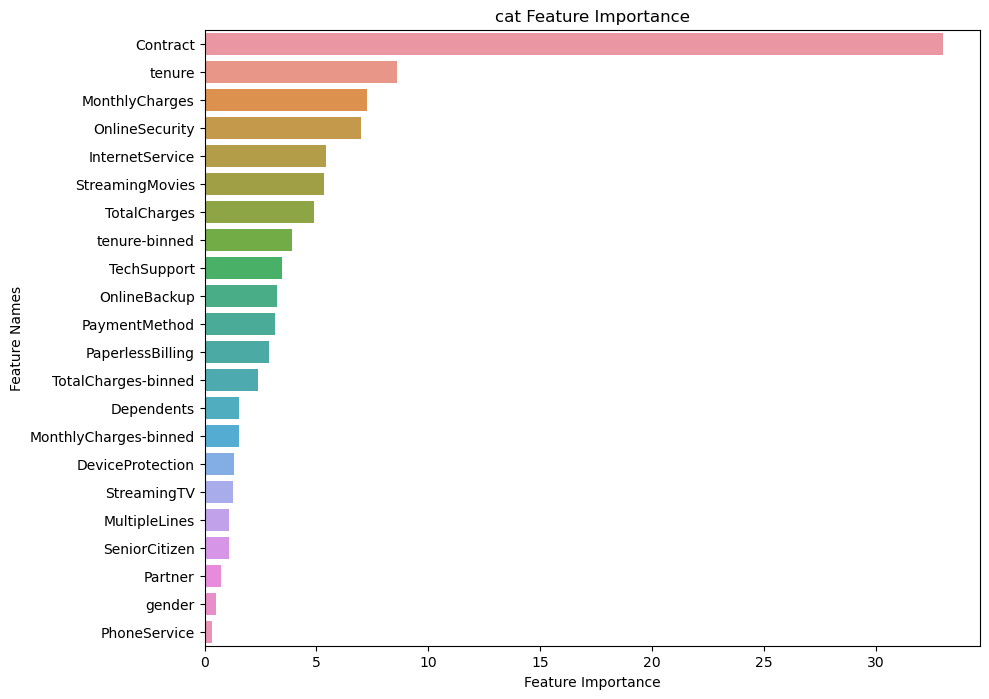

In [62]:
%%time
# Import the necessary library for CatBoostClassifier
from catboost import CatBoostClassifier

# Define the number of folds for cross-validation
fold_num = 10

# Define parameters for the CatBoostClassifier
cat_params = {
    'eval_metric': "AUC",  # Evaluation metric for model performance
    'loss_function': 'logloss',  # Loss function for optimization
    'objective': 'Logloss',  # Objective function for training
    'boosting_type': 'Plain',  # Type of boosting algorithm
    'bootstrap_type': 'Bayesian',  # Type of bootstrapping
    'colsample_bylevel': 0.013457968759952536,  # Column subsampling rate
    'depth': 6,  # Depth of the trees
    'iterations': 6888,  # Number of boosting iterations
    'learning_rate': 0.05683590866750785,  # Learning rate
    'random_strength': 18,  # Random strength parameter
    'l2_leaf_reg': 50,  # L2 regularization parameter
    'random_state': SEED,  # Random seed for reproducibility
}

# Initialize the CatBoostClassifier with the defined parameters
cat = CatBoostClassifier(**cat_params)

# Train the CatBoostClassifier using the train_model function
train_model(cat, 'cat', X, y, X_test, fold_num)

# This code trains a CatBoost classifier on the dataset and evaluates its performance.
# GPU acceleration is commented out due to the small dataset size.


Observation - The provided text appears to be the output from a cross-validation process for a model, likely a machine learning model (indicated by "cat", which might refer to CatBoost or categorical features), using the Area Under the Receiver Operating Characteristic Curve (AUC) as the performance metric:

- The AUC scores for each of the 10 folds range from approximately 0.828 to 0.871. These scores represent the model's ability to distinguish between classes (often binary classes like 0 and 1). An AUC score of 1 represents perfect prediction, while a score of 0.5 represents no better than random guessing.

- The mean AUC score across the 10 folds is 0.8511 with a standard deviation of 0.0146. The standard deviation is relatively low, which suggests that the model's performance is quite stable across different subsets of the data.

- The AUC score on the test set is 0.8472, which is very close to the average AUC score during training. This indicates that the model generalizes well from the training data to unseen data.

- The wall time of 3 minutes 21 seconds indicates the total real-world time taken to run the cross-validation, while the CPU time of 3 minutes 5 seconds indicates the processing time used by the computer's CPU.

Observations:

1. The model exhibits consistent performance across the folds, with no significant variability, as indicated by the low standard deviation.
   
2. The test AUC score is close to the training AUC score, suggesting that the model is not overfitting significantly to the training data.

3. The AUC scores are quite high, well above 0.5, which indicates a good predictive performance.

4. The model's performance seems reliable and it's likely to be a strong baseline model for the given prediction task.

<a id='11.2.2'></a>
### 11.2.2 Optuna Tuning

In [63]:
%%time
def objective(trial):
    # Split the dataset into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=int(SEED), shuffle=True, stratify=y)
    
    # Define the parameters to be optimized
    params = {
        'iterations': trial.suggest_int('iterations', 6000, 8000),  # Number of boosting iterations
        'depth': trial.suggest_int('depth', 3, 12),  # Depth of the trees
        'learning_rate': trial.suggest_loguniform('learning_rate', 1e-3, 1e-1),  # Learning rate
        "objective": trial.suggest_categorical("objective", ["Logloss"]),  # Objective function for training
        'colsample_bylevel': trial.suggest_float("colsample_bylevel", 0.01, 0.1),  # Column subsampling rate
        'random_strength': trial.suggest_int('random_strength', 0, 100),  # Random strength parameter
        "boosting_type": trial.suggest_categorical("boosting_type", ["Ordered", "Plain"]),  # Type of boosting algorithm
        "bootstrap_type": trial.suggest_categorical(
            "bootstrap_type", ["Bayesian", "Bernoulli", "MVS"]  # Type of bootstrapping
        ),
        'random_state': trial.suggest_categorical('random_state', [SEED]),  # Random seed for reproducibility
    }

    # Initialize the CatBoostClassifier with the parameters to be optimized
    model = CatBoostClassifier(
        loss_function="Logloss",
        eval_metric="AUC",
        l2_leaf_reg=50,  # L2 regularization parameter
        **params
    )        
    # Train the model
    model.fit(X_train, y_train)
    
    # Predict probabilities on the test set
    val_preds = model.predict_proba(X_test)[:, 1]
    # Calculate the AUC score
    auc = roc_auc_score(y_test, val_preds)
    
    # Return the AUC score as the objective value
    return auc




CPU times: total: 0 ns
Wall time: 0 ns


In [64]:
%%time
n_trials = int(5)

# Create an Optuna study to optimize the objective function
study = optuna.create_study(direction="maximize", sampler=optuna.samplers.TPESampler(seed=int(SEED)))

# Optimize the objective function with a specified number of trials
study.optimize(objective, n_trials=n_trials, n_jobs=multiprocessing.cpu_count())

# Print the best trial and its hyperparameters
print('BEST TRIAL')
print("Best Score: ", study.best_value)
print('CatBoost Tuned Hyperparameters')
pprint.pprint(study.best_trial.params)


[I 2024-02-19 02:07:49,887] A new study created in memory with name: no-name-c122ea4a-8992-4d82-9605-71afcaa866de


0:	total: 2.33ms	remaining: 15.3s
0:	total: 4.97ms	remaining: 32.6s
1:	total: 8.49ms	remaining: 27.8s
2:	total: 12.2ms	remaining: 26.7s
1:	total: 16ms	remaining: 52.4s
3:	total: 15.2ms	remaining: 24.9s
2:	total: 19.3ms	remaining: 42.1s
4:	total: 19.1ms	remaining: 25s
0:	total: 4.81ms	remaining: 36.1s
3:	total: 31.9ms	remaining: 52.1s
5:	total: 37ms	remaining: 40.4s
6:	total: 40.8ms	remaining: 38.2s
4:	total: 43.6ms	remaining: 57.1s
1:	total: 30.1ms	remaining: 1m 52s
7:	total: 45.3ms	remaining: 37.1s
8:	total: 49.6ms	remaining: 36.1s
5:	total: 55.2ms	remaining: 1m
9:	total: 55.1ms	remaining: 36.1s
2:	total: 45.3ms	remaining: 1m 53s
6:	total: 60.3ms	remaining: 56.4s
10:	total: 59ms	remaining: 35.1s
7:	total: 68ms	remaining: 55.6s
0:	total: 56.3ms	remaining: 6m 3s
11:	total: 67.2ms	remaining: 36.6s
3:	total: 56.3ms	remaining: 1m 45s
8:	total: 71.7ms	remaining: 52.1s
12:	total: 70.7ms	remaining: 35.6s
0:	total: 38.3ms	remaining: 3m 59s
13:	total: 75.3ms	remaining: 35.2s
4:	total: 68.1ms	re

[I 2024-02-19 02:08:16,005] Trial 4 finished with value: 0.8313467152341832 and parameters: {'iterations': 6558, 'depth': 7, 'learning_rate': 0.0020628949392387822, 'objective': 'Logloss', 'colsample_bylevel': 0.02269724632104624, 'random_strength': 69, 'boosting_type': 'Plain', 'bootstrap_type': 'Bayesian', 'random_state': 42}. Best is trial 4 with value: 0.8313467152341832.


4271:	total: 24.1s	remaining: 18.3s
5028:	total: 24s	remaining: 7.26s
1665:	total: 25.3s	remaining: 1m 12s
4274:	total: 24.2s	remaining: 18.3s
5032:	total: 24s	remaining: 7.24s
4275:	total: 24.2s	remaining: 18.3s
1666:	total: 25.3s	remaining: 1m 12s
1473:	total: 25.3s	remaining: 1m 21s
5033:	total: 24.1s	remaining: 7.23s
4276:	total: 24.2s	remaining: 18.2s
5034:	total: 24.1s	remaining: 7.23s
5035:	total: 24.1s	remaining: 7.22s
4277:	total: 24.2s	remaining: 18.2s
1667:	total: 25.3s	remaining: 1m 12s
5036:	total: 24.1s	remaining: 7.22s
1474:	total: 25.3s	remaining: 1m 21s
4278:	total: 24.2s	remaining: 18.2s
5037:	total: 24.1s	remaining: 7.21s
4279:	total: 24.2s	remaining: 18.2s
5038:	total: 24.1s	remaining: 7.21s
4280:	total: 24.2s	remaining: 18.2s
5039:	total: 24.1s	remaining: 7.21s
1668:	total: 25.4s	remaining: 1m 12s
1475:	total: 25.3s	remaining: 1m 21s
4281:	total: 24.2s	remaining: 18.2s
5040:	total: 24.1s	remaining: 7.2s
4282:	total: 24.2s	remaining: 18.2s
5041:	total: 24.1s	remaini

[I 2024-02-19 02:08:24,900] Trial 1 finished with value: 0.8377082848949858 and parameters: {'iterations': 6548, 'depth': 9, 'learning_rate': 0.0031100697882766974, 'objective': 'Logloss', 'colsample_bylevel': 0.06090429384836571, 'random_strength': 71, 'boosting_type': 'Plain', 'bootstrap_type': 'Bayesian', 'random_state': 42}. Best is trial 1 with value: 0.8377082848949858.


5704:	total: 32.3s	remaining: 10.2s
1997:	total: 34s	remaining: 1m 12s
5721:	total: 32.4s	remaining: 10.1s
1998:	total: 34s	remaining: 1m 12s
5723:	total: 32.5s	remaining: 10.1s
2243:	total: 34s	remaining: 1m 3s
1999:	total: 34s	remaining: 1m 12s
5724:	total: 32.5s	remaining: 10.1s
5725:	total: 32.5s	remaining: 10.1s
2000:	total: 34s	remaining: 1m 12s
2244:	total: 34s	remaining: 1m 3s
5726:	total: 32.5s	remaining: 10.1s
5727:	total: 32.5s	remaining: 10.1s
2245:	total: 34s	remaining: 1m 3s
5728:	total: 32.5s	remaining: 10.1s
2001:	total: 34s	remaining: 1m 12s
5729:	total: 32.5s	remaining: 10.1s
5730:	total: 32.5s	remaining: 10.1s
2246:	total: 34s	remaining: 1m 3s
2002:	total: 34.1s	remaining: 1m 12s
5731:	total: 32.5s	remaining: 10.1s
5732:	total: 32.5s	remaining: 10.1s
2247:	total: 34.1s	remaining: 1m 3s
5733:	total: 32.5s	remaining: 10.1s
2003:	total: 34.1s	remaining: 1m 12s
5734:	total: 32.5s	remaining: 10.1s
5735:	total: 32.6s	remaining: 10s
2248:	total: 34.1s	remaining: 1m 3s
2004:

[I 2024-02-19 02:08:44,077] Trial 0 finished with value: 0.8291482600945517 and parameters: {'iterations': 7506, 'depth': 6, 'learning_rate': 0.008998021207335883, 'objective': 'Logloss', 'colsample_bylevel': 0.0803517622631183, 'random_strength': 38, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS', 'random_state': 42}. Best is trial 1 with value: 0.8377082848949858.
[I 2024-02-19 02:10:20,967] Trial 2 finished with value: 0.8316528455914645 and parameters: {'iterations': 6448, 'depth': 4, 'learning_rate': 0.026509240492468642, 'objective': 'Logloss', 'colsample_bylevel': 0.06366966406256401, 'random_strength': 16, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'random_state': 42}. Best is trial 1 with value: 0.8377082848949858.
[I 2024-02-19 02:10:25,139] Trial 3 finished with value: 0.805772559353122 and parameters: {'iterations': 6247, 'depth': 6, 'learning_rate': 0.07988500531754446, 'objective': 'Logloss', 'colsample_bylevel': 0.08227790397661205, 'random_strength': 

BEST TRIAL
Best Score:  0.8377082848949858
CatBoost Tuned Hyperparameters
{'boosting_type': 'Plain',
 'bootstrap_type': 'Bayesian',
 'colsample_bylevel': 0.06090429384836571,
 'depth': 9,
 'iterations': 6548,
 'learning_rate': 0.0031100697882766974,
 'objective': 'Logloss',
 'random_state': 42,
 'random_strength': 71}
CPU times: total: 6min 1s
Wall time: 2min 35s


In [65]:
# Save the best hyperparameters to a pickle file
pickle.dump(study.best_trial.params, open('CatBoost_Hyperparameter.pickle', 'wb'))

# Print the best score and tuned hyperparameters
print("Best Score: ", study.best_value)
print('CatBoost Tuned Hyperparameters')
pprint.pprint(study.best_trial.params)

# Display optimization history
display(optuna.visualization.plot_optimization_history(study))

# # Display parameter importances
# display(plot_param_importances(study))


Best Score:  0.8377082848949858
CatBoost Tuned Hyperparameters
{'boosting_type': 'Plain',
 'bootstrap_type': 'Bayesian',
 'colsample_bylevel': 0.06090429384836571,
 'depth': 9,
 'iterations': 6548,
 'learning_rate': 0.0031100697882766974,
 'objective': 'Logloss',
 'random_state': 42,
 'random_strength': 71}


<a id='11.5'></a>
## 11.5 Stacking Ensemble


In [70]:
# Define a function to prepare data for stacking ensemble learning
def stacking_data_loader(model, model_name, train, y, test, fold):
    '''
    input train, test datasets and fold value!
    returns train, test datasets for stacking ensemble
    '''

    # Initialize stratified k-fold cross-validator
    stk = StratifiedKFold(n_splits = fold, random_state = SEED, shuffle = True)
    
    # Initialize arrays to store predictions
    train_fold_pred = np.zeros((train.shape[0], 1))
    test_pred = np.zeros((test.shape[0], fold))
    
    # Loop through each fold
    for counter, (train_index, valid_index) in enumerate(stk.split(train, y)):
        # Split data into training and validation sets
        X_train, y_train = train.iloc[train_index], y[train_index]
        X_valid, y_valid = train.iloc[valid_index], y[valid_index]

        print('------------ Fold', counter+1, 'Start! ------------')
        # Train the model
        if model_name == 'cat':
            model.fit(X_train, y_train, eval_set=[(X_valid, y_valid)], verbose=False)
        elif model_name == 'xgb':
            model.fit(X_train, y_train, eval_set=[(X_valid, y_valid)])
        else:
            model.fit(X_train, y_train, eval_set=[(X_valid, y_valid)], eval_metric = 'auc')
            
        print('------------ Fold', counter+1, 'Done! ------------')
        
        # Store predictions on validation set
        train_fold_pred[valid_index, :] = model.predict_proba(X_valid)[:, 1].reshape(-1, 1)
        # Store predictions on test set
        test_pred[:, counter] = model.predict_proba(test)[:, 1]
        
        # Clear memory
        del X_train, y_train, X_valid, y_valid
        gc.collect()
        
    # Calculate mean predictions on test set
    test_pred_mean = np.mean(test_pred, axis = 1).reshape(-1, 1)
    
    # Clear memory
    del test_pred
    gc.collect()
    
    print('Done!')
    
    return train_fold_pred, test_pred_mean



<a id='11.5.1'></a>
### 11.5.1 Level 0 : Base Models

In [71]:
# Define parameters for LightGBM
lgbm_params = {'n_estimators': 12749, 
               'learning_rate': 0.1985328656822506, 
               'reg_alpha': 9.77289653841389, 
               'reg_lambda': 4.979048257991328, 
               'num_leaves': 921, 
               'min_child_samples': 85, 
               'max_depth': 56, 
               'colsample_bytree': 0.43848926369957975, 
               'cat_smooth': 92, 
               'cat_l2': 17, 
               'device': 'gpu',  # Use GPU for training
               'gpu_platform_id': 0,  # GPU platform ID
               'gpu_device_id': 0,  # GPU device ID
               'min_data_per_group': 59,
               'random_state': SEED,
              }

# Define parameters for XGBoost
xgb_params = {'colsample_bytree': 0.2645340949128848,
              'eval_metric': 'auc',
              'tree_method': 'gpu_hist',
              'gpu_id': 0,
              'predictor': 'gpu_predictor',
              'gamma': 0,
              'learning_rate': 0.001851851953410451,
              'max_depth': 3,
              'n_estimators': 6000,
              'random_state': SEED,
              'reg_lambda': 0.1,
              'subsample': 0.6905005604726816,
              'use_label_encoder': False,  # Avoid warnings about deprecated label encoder
             }

# Define parameters for CatBoost
cat_params = {'eval_metric':"AUC",
              'loss_function': 'logloss',
              'boosting_type': 'Plain',
              'bootstrap_type': 'Bayesian',
              'colsample_bylevel':  0.07578590621194552,
              'depth': 3,
              'iterations': 6607,
              'learning_rate': 0.0041694052471427405,
              'objective': 'Logloss',
              'random_strength': 18, 
              'l2_leaf_reg': 50,
              'random_state': SEED,
             }

# Initialize the models with the defined parameters
lgbm = lgb.LGBMClassifier(**lgbm_params)
xgb = XGBClassifier(**xgb_params)
cat = CatBoostClassifier(**cat_params)

# Set the number of folds for cross-validation
fold_num = 5

# Prepare data for stacking ensemble using the defined models
cat_train, cat_test = stacking_data_loader(cat, 'cat', X, y, X_test, fold_num)
del cat  # Delete CatBoost model to clear memory
gc.collect()

lgbm_train, lgbm_test = stacking_data_loader(lgbm, 'lgbm', X, y, X_test, fold_num)
del lgbm  # Delete LightGBM model to clear memory
gc.collect()

xgb_train, xgb_test = stacking_data_loader(xgb, 'xgb', X, y, X_test, fold_num)
del xgb  # Delete XGBoost model to clear memory
gc.collect()


------------ Fold 1 Start! ------------
------------ Fold 1 Done! ------------
------------ Fold 2 Start! ------------
------------ Fold 2 Done! ------------
------------ Fold 3 Start! ------------
------------ Fold 3 Done! ------------
------------ Fold 4 Start! ------------
------------ Fold 4 Done! ------------
------------ Fold 5 Start! ------------
------------ Fold 5 Done! ------------
Done!
------------ Fold 1 Start! ------------
[LightGBM] [Info] Number of positive: 1196, number of negative: 3311
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 635
[LightGBM] [Info] Number of data points in the train set: 4507, number of used features: 22
[LightGBM] [Info] Using requested OpenCL platform 0 device 0
[LightGBM] [Info] Using GPU Device: gfx902, Vendor: Advanced Micro Devices, Inc.
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 19 den

0

<a id='11.5.2'></a>
### 11.5.2 Stacking Datasets

In [72]:
# Concatenate the predictions from CatBoost, LightGBM, and XGBoost models for training data
stack_X_train = np.concatenate((cat_train, lgbm_train, xgb_train), axis=1)

# Concatenate the predictions from CatBoost, LightGBM, and XGBoost models for test data
stack_X_test = np.concatenate((cat_test, lgbm_test, xgb_test), axis=1)

# Delete the intermediate variables to clear memory
del cat_train, lgbm_train, xgb_train, cat_test, lgbm_test, xgb_test
gc.collect()

# Display the shapes of the stacked training and test data
stack_X_train.shape, stack_X_test.shape


((5634, 3), (1409, 3))

<a id='11.5.3'></a>
### 11.5.3 Level 1 : Meta Model

Fold 1 AUC : 0.8662732457628487
Fold 2 AUC : 0.8595277333462589
Fold 3 AUC : 0.8520349635661544
Fold 4 AUC : 0.8438191717964876
Fold 5 AUC : 0.8237818120053544
AUC score : mean ---> 0.8490873852954207, std ---> 0.014704890330090224


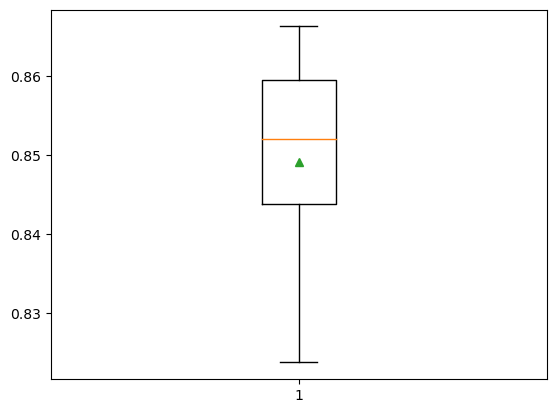

In [75]:
# Define the number of folds for cross-validation
fold = 5

# Initialize StratifiedKFold cross-validator
stk = StratifiedKFold(n_splits=fold, random_state=None, shuffle=False)

# Initialize an array to store test predictions
test_pred_log_reg = np.zeros((stack_X_test.shape[0], fold))

# Initialize a list to store AUC scores
auc_scores = []

# Loop through each fold of the cross-validation
for counter, (train_index, valid_index) in enumerate(stk.split(stack_X_train, y)):
    # Split the stacked training data and target labels into train and validation sets
    X_train, y_train = stack_X_train[train_index], y[train_index]
    X_valid, y_valid = stack_X_train[valid_index], y[valid_index]

    # Initialize a Logistic Regression model
    lr = LogisticRegression(n_jobs=-1, random_state=SEED, C=0.3, max_iter=10000)
    
    # Train the Logistic Regression model on the training data
    lr.fit(X_train, y_train)
    
    # Predict probabilities on the validation set
    valid_pred_log_reg = lr.predict_proba(X_valid)[:, 1]
    
    # Predict probabilities on the test set
    test_pred_log_reg[:, counter] = lr.predict_proba(stack_X_test)[:, 1]

    # Calculate AUC score on the validation set
    auc = roc_auc_score(y_valid, valid_pred_log_reg)
    
    # Append AUC score to the list
    auc_scores.append(auc)

    # Print the AUC score for the current fold
    print('Fold', counter+1 , 'AUC :', auc)

# Calculate mean and standard deviation of AUC scores
print(f'AUC score : mean ---> {np.mean(auc_scores)}, std ---> {np.std(auc_scores)}')

# Box plot of AUC scores
plt.boxplot(auc_scores, showmeans=True)
plt.show()


<a id='11.5.4'></a>
### 11.5.4 Stacking Model Evaluation

In [77]:
# Calculate the AUC score on the test dataset using the mean of predictions from Logistic Regression
test_pred_log_reg_mean = np.mean(test_pred_log_reg, axis = 1).reshape(-1, 1)
roc_auc_score_log_reg = roc_auc_score(y_test, test_pred_log_reg_mean)

# Display the AUC score on the test dataset
print(f"AUC on the test dataset : {roc_auc_score_log_reg}")


AUC on the test dataset : 0.8483530961791832


#### ROC Curve

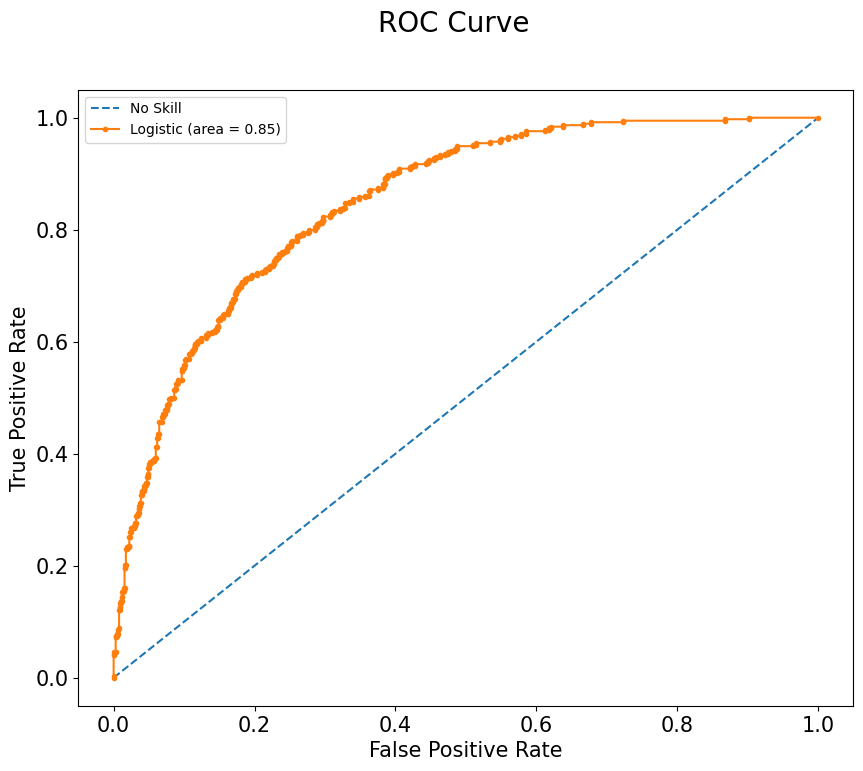

In [78]:
plt.figure(figsize=(10,8))

# Plot the No Skill ROC curve
plt.plot([0, 1], [0, 1], linestyle='--', label='No Skill')

# Calculate the ROC curve for the Logistic Regression model
fpr, tpr, _ = roc_curve(y_test, test_pred_log_reg_mean)

# Plot the ROC curve for the Logistic Regression model
font_size = 15
plt.plot(fpr, tpr, marker='.', label=f'Logistic (area = {roc_auc_score_log_reg:0.2f})')

# Set labels for the axes
plt.xlabel('False Positive Rate', fontsize=font_size)
plt.ylabel('True Positive Rate', fontsize=font_size)
plt.xticks(fontsize=font_size)
plt.yticks(fontsize=font_size)

# Set title for the ROC curve plot
plt.suptitle('ROC Curve', fontsize=20)

# Show the legend
plt.legend()

# Display the plot
plt.show()


#### PR Curve

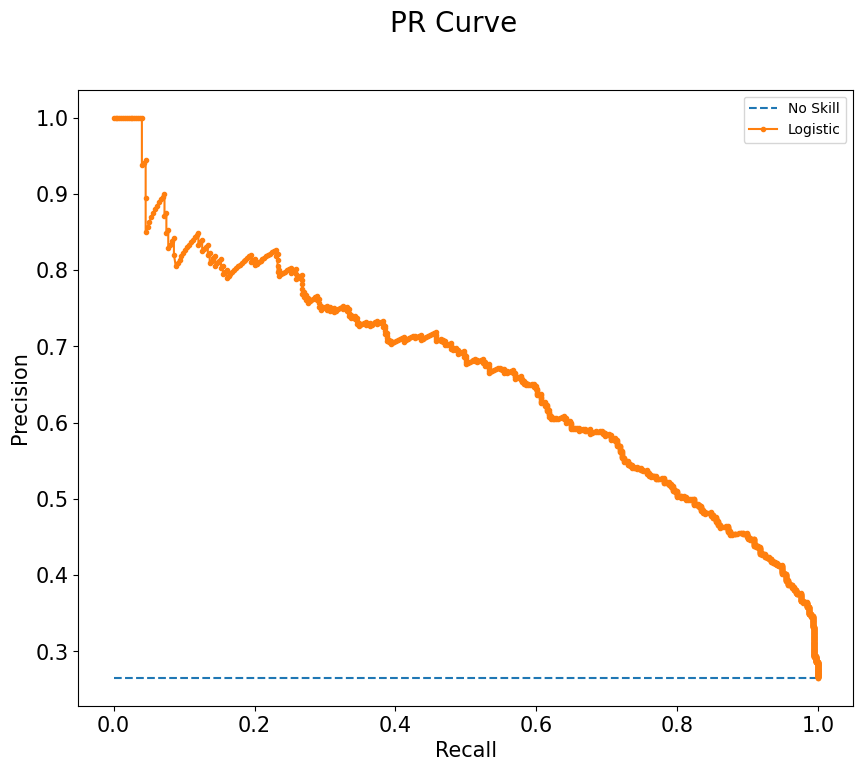

In [79]:
plt.figure(figsize=(10,8))

# Calculate the no skill line as the proportion of the positive class
no_skill = len(y[y==1]) / len(y)

# Plot the No Skill precision-recall curve
plt.plot([0, 1], [no_skill, no_skill], linestyle='--', label='No Skill')

# Calculate the precision-recall curve for the Logistic Regression model
precision, recall, _ = precision_recall_curve(y_test, test_pred_log_reg_mean)

# Plot the precision-recall curve for the Logistic Regression model
font_size = 15
plt.plot(recall, precision, marker='.', label='Logistic')

# Set title for the Precision-Recall curve plot
plt.suptitle('PR Curve', fontsize=20)

# Set labels for the axes
plt.xlabel('Recall', fontsize=font_size)
plt.ylabel('Precision', fontsize=font_size)
plt.xticks(fontsize=font_size)
plt.yticks(fontsize=font_size)

# Show the legend
plt.legend()

# Display the plot
plt.show()


<a id='11.5.5'></a>
### 11.5.5 Stacking Ensemble Classic ML Models

In [80]:
# 5 fold stacking ensembling with 3 Repeated Stratified 10-Fold cross validation

# get a stacking ensemble of models
def get_stacking():
    # define the base models
    level0 = list()
    level0.append(('logreg', LogisticRegression()))
    level0.append(('knn', KNeighborsClassifier()))
    level0.append(('rforest', RandomForestClassifier()))
    level0.append(('etree', ExtraTreesClassifier()))
    level0.append(('svm', SVC()))

    # define meta learner model
    level1 = LogisticRegression()

    # define the stacking ensemble
    model = StackingClassifier(estimators=level0, final_estimator=level1, cv=5)
    return model
 
# get a list of models to evaluate
def get_models():
    models = dict()
    models['logreg'] = LogisticRegression()
    models['knn'] = KNeighborsClassifier()
    models['rforest'] = RandomForestClassifier()
    models['etree'] = ExtraTreesClassifier()
    models['svm'] = SVC()
    models['stacking'] = get_stacking()
    return models

# evaluate a give model using cross-validation
def evaluate_model(model, X, y):
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
    return scores

# get the models to evaluate
models = get_models()

# evaluate the models and store results
results, names = list(), list()

print("**Model Evaluation :**")

for name, model in models.items():
    scores = evaluate_model(model, X, y)
    results.append(scores)
    names.append(name)
    print('>%s, cross-validation score - mean  : %.3f std: (%.3f)' % (name, np.mean(scores), np.std(scores)))


# plot model performance for comparison
font_size = 15
plt.figure(figsize=(10,8))
plt.boxplot(results, labels=names, showmeans=True)

plt.title("Model Performance",  fontsize=font_size)
plt.xlabel("ML Models", fontsize=font_size)
plt.ylabel("Cross-val Score",  fontsize=font_size)
plt.xticks(fontsize=font_size)
plt.yticks(fontsize=font_size)

plt.show()

**Model Evaluation :**
>logreg, cross-validation score - mean  : 0.805 std: (0.019)


AttributeError: 'Flags' object has no attribute 'c_contiguous'

**Model Evaluation:**
>logreg, cross-validation score - mean: 0.805, std: 0.019


joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\vigne\anaconda3\Lib\site-packages\joblib\externals\loky\process_executor.py", line 428, in _process_worker
    r = call_item()
        ^^^^^^^^^^^
  File "C:\Users\vigne\anaconda3\Lib\site-packages\joblib\externals\loky\process_executor.py", line 275, in __call__
    return self.fn(*self.args, **self.kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\vigne\anaconda3\Lib\site-packages\joblib\_parallel_backends.py", line 620, in __call__
    return self.func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\vigne\anaconda3\Lib\site-packages\joblib\parallel.py", line 288, in __call__
    return [func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\vigne\anaconda3\Lib\site-packages\joblib\parallel.py", line 288, in <listcomp>
    return [func(*args, **kwargs)
            ^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\vigne\a

Error occurred while evaluating model knn: 'Flags' object has no attribute 'c_contiguous'
>rforest, cross-validation score - mean: 0.791, std: 0.020
>etree, cross-validation score - mean: 0.780, std: 0.014
>svm, cross-validation score - mean: 0.797, std: 0.018


joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "C:\Users\vigne\anaconda3\Lib\site-packages\joblib\externals\loky\process_executor.py", line 428, in _process_worker
    r = call_item()
        ^^^^^^^^^^^
  File "C:\Users\vigne\anaconda3\Lib\site-packages\joblib\externals\loky\process_executor.py", line 275, in __call__
    return self.fn(*self.args, **self.kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\vigne\anaconda3\Lib\site-packages\joblib\_parallel_backends.py", line 620, in __call__
    return self.func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\vigne\anaconda3\Lib\site-packages\joblib\parallel.py", line 288, in __call__
    return [func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\vigne\anaconda3\Lib\site-packages\joblib\parallel.py", line 288, in <listcomp>
    return [func(*args, **kwargs)
            ^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\vigne\a

Error occurred while evaluating model stacking: 'Flags' object has no attribute 'c_contiguous'


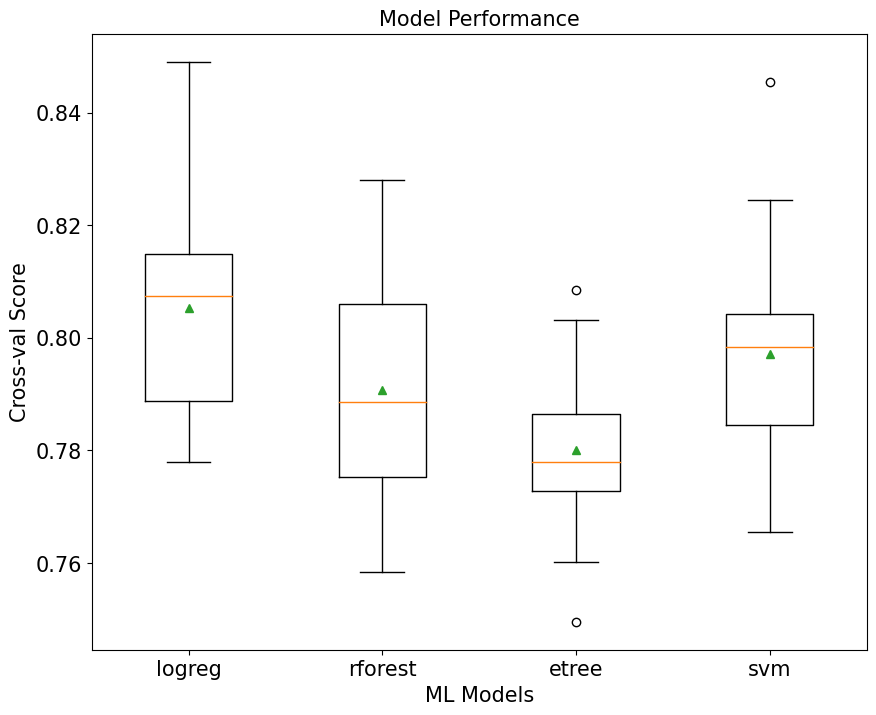

In [83]:
import traceback

def evaluate_model(model, X, y):
    try:
        # Define the cross-validation strategy
        cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
        # Evaluate the model using cross-validation
        scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
        return scores
    except Exception as e:
        # Print detailed traceback of the error
        traceback.print_exc()
        raise e

# Get the models for evaluation
models = get_models()

# Evaluate the models and store results
results, names = list(), list()
print("**Model Evaluation:**")
for name, model in models.items():
    try:
        scores = evaluate_model(model, X, y)
        results.append(scores)
        names.append(name)
        print(f'>{name}, cross-validation score - mean: {np.mean(scores):.3f}, std: {np.std(scores):.3f}')
    except Exception as e:
        print(f'Error occurred while evaluating model {name}: {e}')

# Plot model performance for comparison
font_size = 15
plt.figure(figsize=(10, 8))
plt.boxplot(results, labels=names, showmeans=True)
plt.title("Model Performance", fontsize=font_size)
plt.xlabel("ML Models", fontsize=font_size)
plt.ylabel("Cross-val Score", fontsize=font_size)
plt.xticks(fontsize=font_size)
plt.yticks(fontsize=font_size)
plt.show()


<a id='12'></a>
# 12 Load Model

## Model Files

In [85]:
import os
os.listdir('./')

['.ipynb_checkpoints',
 'AIA_Churn_Modelling_Case_Study.csv',
 'CatBoost_Hyperparameter.pickle',
 'catboost_info',
 'churn-prediction.ipynb',
 'model_catboost',
 'Telco-Customer-Churn-dataset-cleaned.csv']